## Import Libraries

In [1]:
import pandas as pd 
import numpy as np 
import plotly.express as px 
import plotly.graph_objects as go 
import plotly.figure_factory as ff
import seaborn as sns


## Load Data

In [2]:
df = pd.read_csv("loan_data.csv")
df

,person_age,person_gender,person_education,person_income,person_emp_exp,person_home_ownership,loan_amnt,loan_intent,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,credit_score,previous_loan_defaults_on_file,loan_status
0,22.0,female,Master,71948.0,0,RENT,35000.0,PERSONAL,16.02,0.49,3.0,561,No,1
1,21.0,female,High School,12282.0,0,OWN,1000.0,EDUCATION,11.14,0.08,2.0,504,Yes,0
2,25.0,female,High School,12438.0,3,MORTGAGE,5500.0,MEDICAL,12.87,0.44,3.0,635,No,1
3,23.0,female,Bachelor,79753.0,0,RENT,35000.0,MEDICAL,15.23,0.44,2.0,675,No,1
4,24.0,male,Master,66135.0,1,RENT,35000.0,MEDICAL,14.27,0.53,4.0,586,No,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44995,27.0,male,Associate,47971.0,6,RENT,15000.0,MEDICAL,15.66,0.31,3.0,645,No,1
44996,37.0,female,Associate,65800.0,17,RENT,9000.0,HOMEIMPROVEMENT,14.07,0.14,11.0,621,No,1
44997,33.0,male,Associate,56942.0,7,RENT,2771.0,DEBTCONSOLIDATION,10.02,0.05,10.0,668,No,1
44998,29.0,male,Bachelor,33164.0,4,RENT,12000.0,EDUCATION,13.23,0.36,6.0,604,No,1


In [3]:
df['person_age'] = df['person_age'].astype(int)
df

,person_age,person_gender,person_education,person_income,person_emp_exp,person_home_ownership,loan_amnt,loan_intent,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,credit_score,previous_loan_defaults_on_file,loan_status
0,22,female,Master,71948.0,0,RENT,35000.0,PERSONAL,16.02,0.49,3.0,561,No,1
1,21,female,High School,12282.0,0,OWN,1000.0,EDUCATION,11.14,0.08,2.0,504,Yes,0
2,25,female,High School,12438.0,3,MORTGAGE,5500.0,MEDICAL,12.87,0.44,3.0,635,No,1
3,23,female,Bachelor,79753.0,0,RENT,35000.0,MEDICAL,15.23,0.44,2.0,675,No,1
4,24,male,Master,66135.0,1,RENT,35000.0,MEDICAL,14.27,0.53,4.0,586,No,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44995,27,male,Associate,47971.0,6,RENT,15000.0,MEDICAL,15.66,0.31,3.0,645,No,1
44996,37,female,Associate,65800.0,17,RENT,9000.0,HOMEIMPROVEMENT,14.07,0.14,11.0,621,No,1
44997,33,male,Associate,56942.0,7,RENT,2771.0,DEBTCONSOLIDATION,10.02,0.05,10.0,668,No,1
44998,29,male,Bachelor,33164.0,4,RENT,12000.0,EDUCATION,13.23,0.36,6.0,604,No,1


In [4]:
# Drop rows where 'person_age' is greater than 70
df = df[df['person_age'] <= 70]

In [5]:
#reset index again
df.reset_index(inplace = True , drop = True )

In [6]:
df["person_age"].describe()

count    44985.000000
mean        27.739335
std          5.870099
min         20.000000
25%         24.000000
50%         26.000000
75%         30.000000
max         70.000000
Name: person_age, dtype: float64

## Bivariate Analysis

In [7]:
def age_group(person_age):
    
    if 18<person_age<=25 :
        return "18-25"
    elif 26<=person_age<=35 :
        return "26-35"
    elif 36<=person_age<=50:
        return "36-50"
    else:  
        return "51+"
   

In [8]:
df['grouped_age']=df['person_age'].apply(age_group)

In [9]:
df

,person_age,person_gender,person_education,person_income,person_emp_exp,person_home_ownership,loan_amnt,loan_intent,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,credit_score,previous_loan_defaults_on_file,loan_status,grouped_age
0,22,female,Master,71948.0,0,RENT,35000.0,PERSONAL,16.02,0.49,3.0,561,No,1,18-25
1,21,female,High School,12282.0,0,OWN,1000.0,EDUCATION,11.14,0.08,2.0,504,Yes,0,18-25
2,25,female,High School,12438.0,3,MORTGAGE,5500.0,MEDICAL,12.87,0.44,3.0,635,No,1,18-25
3,23,female,Bachelor,79753.0,0,RENT,35000.0,MEDICAL,15.23,0.44,2.0,675,No,1,18-25
4,24,male,Master,66135.0,1,RENT,35000.0,MEDICAL,14.27,0.53,4.0,586,No,1,18-25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44980,27,male,Associate,47971.0,6,RENT,15000.0,MEDICAL,15.66,0.31,3.0,645,No,1,26-35
44981,37,female,Associate,65800.0,17,RENT,9000.0,HOMEIMPROVEMENT,14.07,0.14,11.0,621,No,1,36-50
44982,33,male,Associate,56942.0,7,RENT,2771.0,DEBTCONSOLIDATION,10.02,0.05,10.0,668,No,1,26-35
44983,29,male,Bachelor,33164.0,4,RENT,12000.0,EDUCATION,13.23,0.36,6.0,604,No,1,26-35


In [10]:
#Ignore Warnings
import warnings
warnings.filterwarnings("ignore")

In [11]:
Person_Ages_Gender = df.groupby(['person_gender','grouped_age']).size().unstack(fill_value=0).reset_index()

In [12]:
Person_Ages_Gender

grouped_age,person_gender,18-25,26-35,36-50,51+
0,female,9185,9106,1764,100
1,male,11256,10967,2394,213


In [13]:
melted = Person_Ages_Gender.melt(
    id_vars='person_gender',  # The column(s) to keep fixed
    var_name='grouped_age',  # The new column name for the previous column headers
    value_name='Count'       # The new column name for the values
)
melted

,person_gender,grouped_age,Count
0,female,18-25,9185
1,male,18-25,11256
2,female,26-35,9106
3,male,26-35,10967
4,female,36-50,1764
5,male,36-50,2394
6,female,51+,100
7,male,51+,213


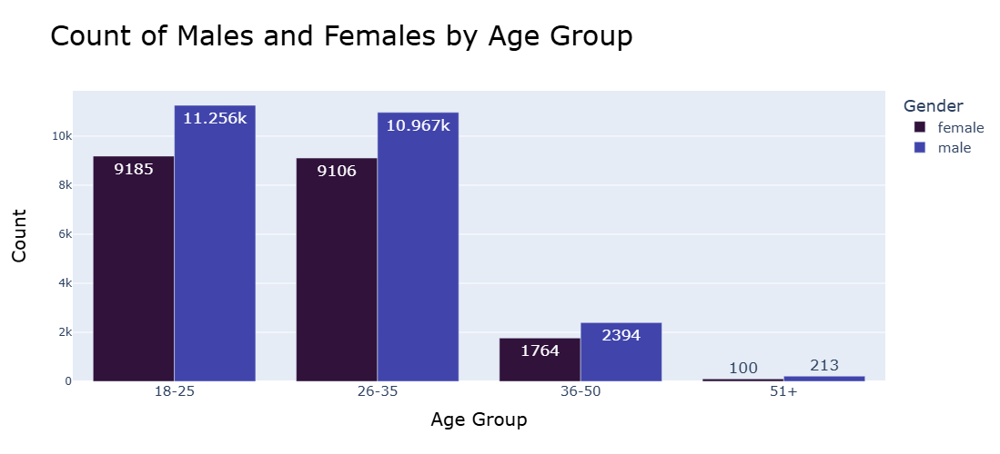

In [14]:
# Create the bar chart
fig = px.bar(data_frame=melted,x='grouped_age',y='Count',color='person_gender',title='Count of Males and Females by Age Group',
             labels={'grouped_age': 'Age Group', 'Count': 'Count', 'person_gender': 'Gender'},height=500,width=1000,
             color_discrete_sequence=px.colors.sequential.Turbo,text_auto=True,barmode='group')
# Customize the text size
fig.update_traces(textfont_size=17)

# Update layout for titles, fonts, and legend
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=20, color='black'),
    yaxis_title_font=dict(size=20, color='black'),legend=dict(font=dict(size=15)),xaxis=dict(tickfont=dict(size=15)))
# Show the chart
fig.show()


In [15]:
Person_Ages_Education = df.groupby(['person_education','grouped_age']).size().unstack(fill_value=0).reset_index()
Person_Ages_Education

grouped_age,person_education,18-25,26-35,36-50,51+
0,Associate,5194,5359,1373,98
1,Bachelor,6030,6653,658,52
2,Doctorate,0,408,196,17
3,High School,6130,4215,1505,117
4,Master,3087,3438,426,29


In [16]:
melted = Person_Ages_Education.melt(
    id_vars='person_education',  # The column(s) to keep fixed
    var_name='grouped_age',  # The new column name for the previous column headers
    value_name='Count'       # The new column name for the values
)
melted

,person_education,grouped_age,Count
0,Associate,18-25,5194
1,Bachelor,18-25,6030
2,Doctorate,18-25,0
3,High School,18-25,6130
4,Master,18-25,3087
5,Associate,26-35,5359
6,Bachelor,26-35,6653
7,Doctorate,26-35,408
8,High School,26-35,4215
9,Master,26-35,3438


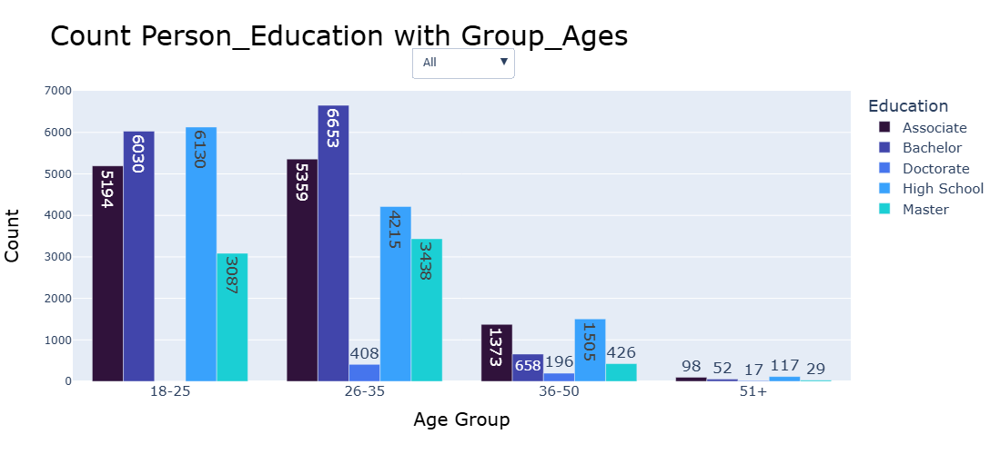

In [17]:
# Create the bar chart
fig = px.bar(data_frame=melted,x='grouped_age',y='Count',color='person_education',title='Count Person_Education with Group_Ages',
             labels={'grouped_age': 'Age Group', 'Count': 'Count', 'person_education': 'Education'},height=500,width=1000,
             color_discrete_sequence=px.colors.sequential.Turbo,text_auto=True,barmode='group')
# Customize the text size
fig.update_traces(textfont_size=17)

# Update layout for titles, fonts, and legend
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=20, color='black'),
    yaxis_title_font=dict(size=20, color='black'),legend=dict(font=dict(size=15)),xaxis=dict(tickfont=dict(size=15)))
# Show the chart
# Add dropdown filter for person_education
unique_education_levels = melted['person_education'].unique()
dropdown_buttons = [
    {'label': 'All', 'method': 'update', 'args': [{'visible': [True] * len(fig.data)}]}  # Show all data
]

# Add a button for each education level
for i, education in enumerate(unique_education_levels):
    visibility = [trace.name == education for trace in fig.data]
    dropdown_buttons.append({'label': education, 'method': 'update', 'args': [{'visible': visibility}]})

# Add the dropdown menu to the layout
fig.update_layout(
    updatemenus=[{
        'buttons': dropdown_buttons,
        'direction': 'down',
        'showactive': True,
        'x': 0.5,
        'y': 1.15,
        'xanchor': 'center',
        'yanchor': 'top'
    }]
)

# Show the chart
fig.show()

In [18]:
# Replace 1 with 'Yes' and 0 with 'No' in the original dataset
df['loan_status'] = df['loan_status'].replace({1: 'Yes', 0: 'No'})

## Categorize the loan_status Over Education?

In [19]:
Loan_Education = df.groupby(['person_education','loan_status']).size().unstack(fill_value=0).reset_index()
Loan_Education

loan_status,person_education,No,Yes
0,Associate,9374,2650
1,Bachelor,10375,3018
2,Doctorate,479,142
3,High School,9296,2671
4,Master,5461,1519


In [20]:
melted = Loan_Education.melt(
    id_vars='person_education',  # The column(s) to keep fixed
    var_name='loan_status',  # The new column name for the previous column headers
    value_name='Count'       # The new column name for the values
)
melted

,person_education,loan_status,Count
0,Associate,No,9374
1,Bachelor,No,10375
2,Doctorate,No,479
3,High School,No,9296
4,Master,No,5461
5,Associate,Yes,2650
6,Bachelor,Yes,3018
7,Doctorate,Yes,142
8,High School,Yes,2671
9,Master,Yes,1519


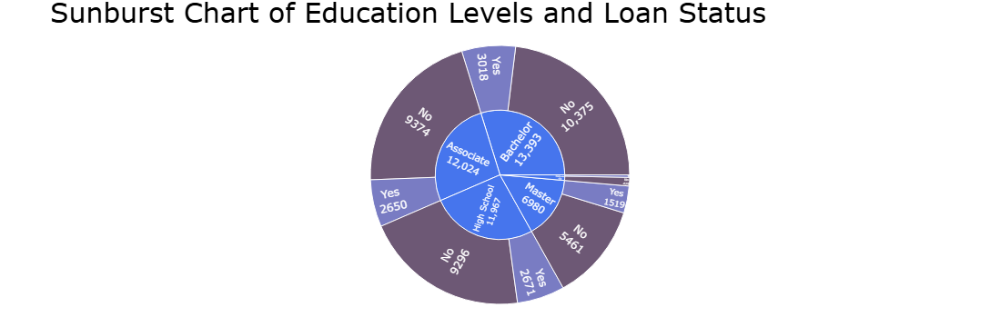

In [21]:
fig = px.sunburst(
    data_frame=melted,
    path=['person_education', 'loan_status'],  # Hierarchical levels
    values='Count',  # Size of segments
    color='loan_status',
    title='Sunburst Chart of Education Levels and Loan Status',
    color_discrete_sequence=px.colors.sequential.Turbo
)
fig.update_traces(
    textinfo='label+value',  # Display both label and count
    insidetextorientation='radial'  # Ensure text aligns outward
)

# Customize layout
fig.update_layout(
    title_font=dict(size=30, color='black'),
    margin=dict(t=50, l=25, r=25, b=25)
)

# Show the chart
fig.show()

In [22]:
df

,person_age,person_gender,person_education,person_income,person_emp_exp,person_home_ownership,loan_amnt,loan_intent,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,credit_score,previous_loan_defaults_on_file,loan_status,grouped_age
0,22,female,Master,71948.0,0,RENT,35000.0,PERSONAL,16.02,0.49,3.0,561,No,Yes,18-25
1,21,female,High School,12282.0,0,OWN,1000.0,EDUCATION,11.14,0.08,2.0,504,Yes,No,18-25
2,25,female,High School,12438.0,3,MORTGAGE,5500.0,MEDICAL,12.87,0.44,3.0,635,No,Yes,18-25
3,23,female,Bachelor,79753.0,0,RENT,35000.0,MEDICAL,15.23,0.44,2.0,675,No,Yes,18-25
4,24,male,Master,66135.0,1,RENT,35000.0,MEDICAL,14.27,0.53,4.0,586,No,Yes,18-25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44980,27,male,Associate,47971.0,6,RENT,15000.0,MEDICAL,15.66,0.31,3.0,645,No,Yes,26-35
44981,37,female,Associate,65800.0,17,RENT,9000.0,HOMEIMPROVEMENT,14.07,0.14,11.0,621,No,Yes,36-50
44982,33,male,Associate,56942.0,7,RENT,2771.0,DEBTCONSOLIDATION,10.02,0.05,10.0,668,No,Yes,26-35
44983,29,male,Bachelor,33164.0,4,RENT,12000.0,EDUCATION,13.23,0.36,6.0,604,No,Yes,26-35


## What are the Approval Rates for Age_Group?

In [23]:
Approval_Rate = df.groupby("grouped_age")["loan_status"].apply(lambda x: (x =="Yes").mean()*100)

In [24]:
Approval_Rate_df = Approval_Rate.reset_index().round()
Approval_Rate_df.columns = ["grouped_age", "Approval_Rate"]
Approval_Rate_df

,grouped_age,Approval_Rate
0,18-25,23.0
1,26-35,21.0
2,36-50,21.0
3,51+,27.0


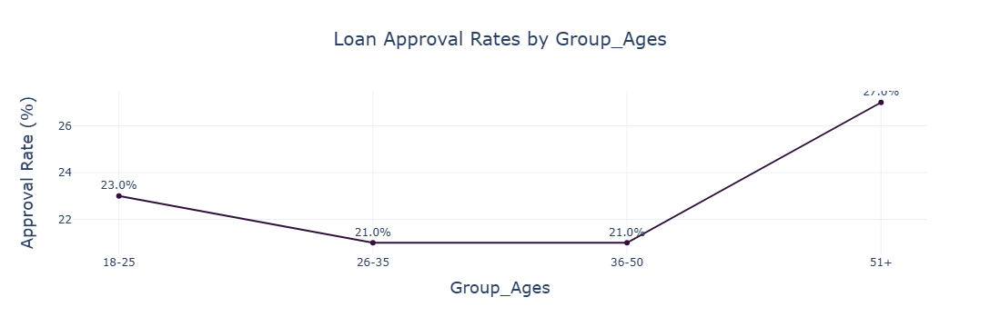

In [25]:
# Create the line chart with labels
fig = px.line(
    Approval_Rate_df,
    x="grouped_age",
    y="Approval_Rate",
    title="Loan Approval Rates by Group_Ages",
    markers=True,
    color_discrete_sequence=px.colors.sequential.Turbo,
    text="Approval_Rate"  # Add labels
)

# Customize the text position and display
fig.update_traces(
    textposition="top center",  # Position labels above the line
    texttemplate="%{text:.1f}%"  # Format labels to show one decimal place with a percentage symbol
)

# Customize axis labels and chart layout
fig.update_layout(
    xaxis_title="Group_Ages",
    yaxis_title="Approval Rate (%)",
    title_font_size=20,
    xaxis_title_font_size=18,
    yaxis_title_font_size=18,
    template="plotly_white",
    title_x=0.5  # Center the title
)

# Show the chart
fig.show()


## What are the Approval Rates for Education?

In [26]:
Approval_Rate_Edu = df.groupby("person_education")["loan_status"].apply(lambda x: (x =="Yes").mean()*100).round().reset_index()
Approval_Rate_Edu 

,person_education,loan_status
0,Associate,22.0
1,Bachelor,23.0
2,Doctorate,23.0
3,High School,22.0
4,Master,22.0


In [27]:
Approval_Rate_Edu .columns = ["person_education", "Approval_Rate_Edu"]
Approval_Rate_Edu ['Approval_Rate_Edu'] = Approval_Rate_Edu ['Approval_Rate_Edu'].apply(lambda x: f"{x}%")
Approval_Rate_Edu 

,person_education,Approval_Rate_Edu
0,Associate,22.0%
1,Bachelor,23.0%
2,Doctorate,23.0%
3,High School,22.0%
4,Master,22.0%


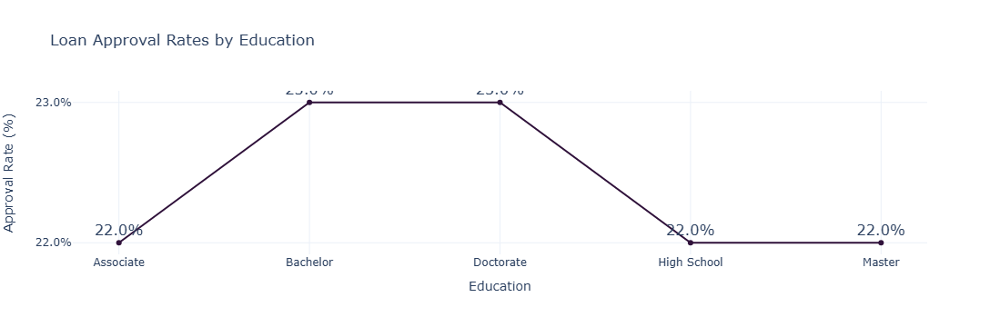

In [28]:
# Create the line chart with labels
fig = px.line(
    Approval_Rate_Edu ,
    x="person_education",
    y="Approval_Rate_Edu",
    title="Loan Approval Rates by Education",
    markers=True,
    color_discrete_sequence=px.colors.sequential.Turbo,
    text="Approval_Rate_Edu"  # Add labels
)

# Customize the text position to display above the line
fig.update_traces(
    textposition="top center",# Position labels above the line
    textfont= dict(size=16  # Make the font bold
    )
)

# Customize layout for better presentation
fig.update_layout(
    xaxis_title="Education",
    yaxis_title="Approval Rate (%)",
    template="plotly_white"
)


# Show the chart
fig.show()


##  What are the Approval Rtes for Income Group?

In [29]:
# Function to categorize income dynamically
def categorize_income(income):
    if income < 50000:
        return 'Low'
    elif 50000 <= income < 200000:
        return 'Medium'
    elif 200000 <= income < 1000000:
        return 'High'
    else:
        return 'Very High'

# Apply the function to create the 'income_group' column
df['income_group'] = df['person_income'].apply(categorize_income)

In [30]:
df['income_group']

0        Medium
1           Low
2           Low
3        Medium
4        Medium
          ...  
44980       Low
44981    Medium
44982    Medium
44983       Low
44984    Medium
Name: income_group, Length: 44985, dtype: object

In [31]:
Approval_Rate_ = df.groupby("income_group")["loan_status"].apply(lambda x: (x =="Yes").mean()*100).round().reset_index()
Approval_Rate_

,income_group,loan_status
0,High,10.0
1,Low,38.0
2,Medium,16.0
3,Very High,0.0


In [32]:
Approval_Rate_.columns = ["income_group", "Approval_Rate_income"]
Approval_Rate_

,income_group,Approval_Rate_income
0,High,10.0
1,Low,38.0
2,Medium,16.0
3,Very High,0.0


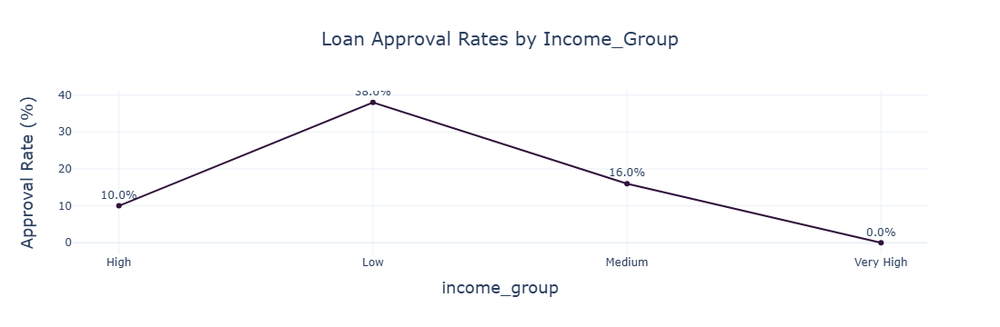

In [33]:
# Create the line chart with labels
fig = px.line(
    Approval_Rate_,
    x="income_group",
    y="Approval_Rate_income",
    title="Loan Approval Rates by Income_Group",
    markers=True,
    color_discrete_sequence=px.colors.sequential.Turbo,
    text="Approval_Rate_income"  # Add labels
)

# Customize the text position and display
fig.update_traces(
    textposition="top center",  # Position labels above the line
    texttemplate="%{text:.1f}%"  # Format labels to show one decimal place with a percentage symbol
)

# Customize axis labels and chart layout
fig.update_layout(
    xaxis_title="income_group",
    yaxis_title="Approval Rate (%)",
    title_font_size=20,
    xaxis_title_font_size=18,
    yaxis_title_font_size=18,
    template="plotly_white",
    title_x=0.5  # Center the title
)

# Show the chart
fig.show()


## What are the Approval Rates for Gender?

In [34]:
Approval_Rate_G = df.groupby("person_gender")["loan_status"].apply(lambda x: (x =="Yes").mean()*100).round().reset_index()
Approval_Rate_G

,person_gender,loan_status
0,female,22.0
1,male,22.0


In [35]:
Approval_Rate_G.columns = ["person_gender", "Approval_Rate_gender"]
Approval_Rate_G['Approval_Rate_gender'] = Approval_Rate_G['Approval_Rate_gender'].apply(lambda x: f"{x}%")
Approval_Rate_G

,person_gender,Approval_Rate_gender
0,female,22.0%
1,male,22.0%


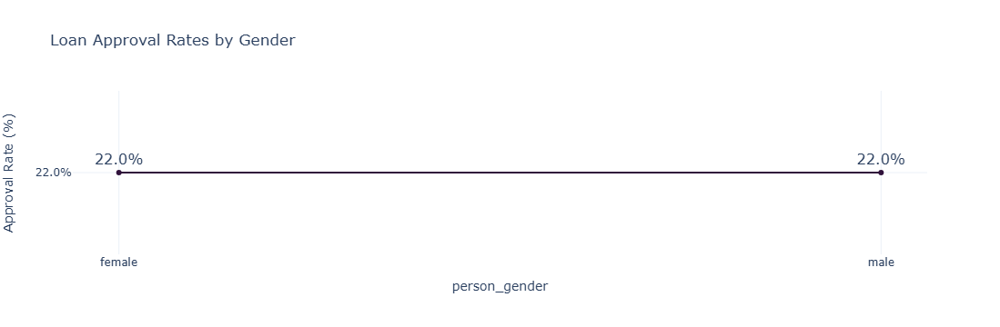

In [36]:
# Create the line chart with labels
fig = px.line(
    Approval_Rate_G ,
    x="person_gender",
    y="Approval_Rate_gender",
    title="Loan Approval Rates by Gender",
    markers=True,
    color_discrete_sequence=px.colors.sequential.Turbo,
    text="Approval_Rate_gender"  # Add labels
)

# Customize the text position to display above the line
fig.update_traces(
    textposition="top center",# Position labels above the line
    textfont= dict(size=16  # Make the font bold
    )
)

# Customize layout for better presentation
fig.update_layout(
    xaxis_title="person_gender",
    yaxis_title="Approval Rate (%)",
    template="plotly_white"
)


# Show the chart
fig.show()


## What are The Count of Bachelor_Customers For each Income_Group?

In [37]:
edu = df[df['person_education'] == 'Bachelor'].groupby('income_group').size().reset_index(name='Count')
edu

,income_group,Count
0,High,356
1,Low,3869
2,Medium,9165
3,Very High,3


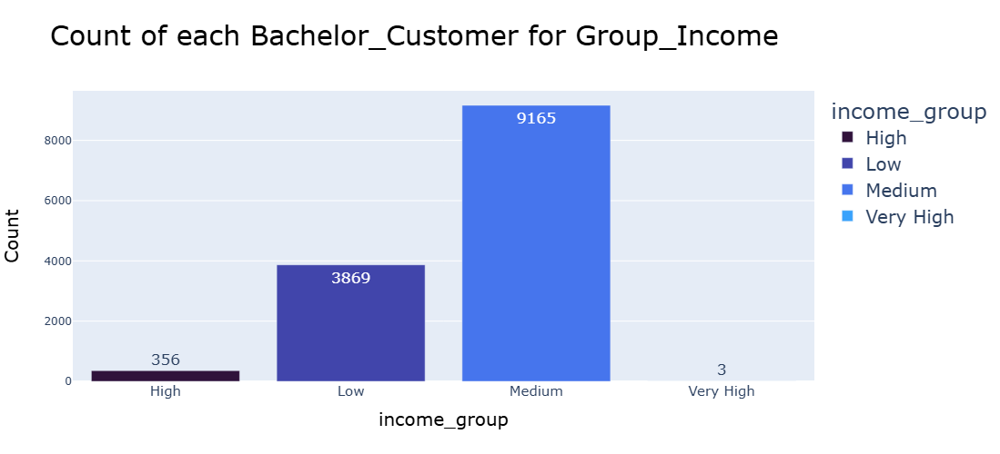

In [38]:
# Create the bar chart
fig = px.bar(
    data_frame=edu,
    x='income_group',
    y='Count',
    color='income_group',
    title='Count of each Bachelor_Customer for Group_Income',
    labels={
        'grouped_age': 'Age Group',
        'Count': 'Count',
        'person_gender': 'Gender'
    },
    height=500,
    width=1000,
    color_discrete_sequence=px.colors.sequential.Turbo,  # Turbo color palette
    text_auto=True,  # Automatically add text labels to bars
)

# Customize the text size
fig.update_traces(textfont_size=17)

# Update layout for titles, fonts, and legend
fig.update_layout(
    title_font=dict(size=30, color='black'),  # Title font size and color
    xaxis_title_font=dict(size=20, color='black'),  # X-axis label font size and color
    yaxis_title_font=dict(size=20, color='black'),  # Y-axis label font size and color
    legend=dict(font=dict(size=20)),  # Legend font size
    xaxis=dict(tickfont=dict(size=15))  # X-axis tick font size
)

# Show the chart
fig.show()

##  What are the Approval Rates for Employment_Categories?

In [39]:
df = df[df['person_emp_exp'] <= 40]
df

,person_age,person_gender,person_education,person_income,person_emp_exp,person_home_ownership,loan_amnt,loan_intent,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,credit_score,previous_loan_defaults_on_file,loan_status,grouped_age,income_group
0,22,female,Master,71948.0,0,RENT,35000.0,PERSONAL,16.02,0.49,3.0,561,No,Yes,18-25,Medium
1,21,female,High School,12282.0,0,OWN,1000.0,EDUCATION,11.14,0.08,2.0,504,Yes,No,18-25,Low
2,25,female,High School,12438.0,3,MORTGAGE,5500.0,MEDICAL,12.87,0.44,3.0,635,No,Yes,18-25,Low
3,23,female,Bachelor,79753.0,0,RENT,35000.0,MEDICAL,15.23,0.44,2.0,675,No,Yes,18-25,Medium
4,24,male,Master,66135.0,1,RENT,35000.0,MEDICAL,14.27,0.53,4.0,586,No,Yes,18-25,Medium
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44980,27,male,Associate,47971.0,6,RENT,15000.0,MEDICAL,15.66,0.31,3.0,645,No,Yes,26-35,Low
44981,37,female,Associate,65800.0,17,RENT,9000.0,HOMEIMPROVEMENT,14.07,0.14,11.0,621,No,Yes,36-50,Medium
44982,33,male,Associate,56942.0,7,RENT,2771.0,DEBTCONSOLIDATION,10.02,0.05,10.0,668,No,Yes,26-35,Medium
44983,29,male,Bachelor,33164.0,4,RENT,12000.0,EDUCATION,13.23,0.36,6.0,604,No,Yes,26-35,Low


In [40]:
# Function to categorize years of employment
def categorize_employment_years(years):
    if years <= 3:
        return 'Entry-Level'
    elif 4 <= years <= 7:
        return 'Early Career'
    elif 8 <= years <= 15:
        return 'Mid-Level'
    elif 16 <= years <= 25:
        return 'Senior-Level'
    else:
        return 'Veteran'

# Apply the function to the column
df['employment_category'] = df['person_emp_exp'].apply(categorize_employment_years)

In [41]:
Approval_Rate_Emp = df.groupby("employment_category")["loan_status"].apply(lambda x: (x =="Yes").mean()*100).round().reset_index()
Approval_Rate_Emp

,employment_category,loan_status
0,Early Career,21.0
1,Entry-Level,23.0
2,Mid-Level,21.0
3,Senior-Level,20.0
4,Veteran,26.0


In [42]:
Approval_Rate_Emp.columns = ["employment_category", "Approval_Rate_Employment"]
Approval_Rate_Emp

,employment_category,Approval_Rate_Employment
0,Early Career,21.0
1,Entry-Level,23.0
2,Mid-Level,21.0
3,Senior-Level,20.0
4,Veteran,26.0


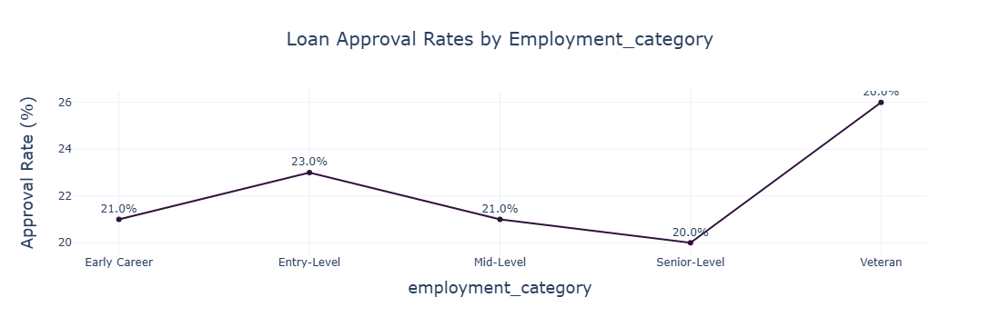

In [43]:
# Create the line chart with labels
fig = px.line(
    Approval_Rate_Emp,
    x="employment_category",
    y="Approval_Rate_Employment",
    title="Loan Approval Rates by Employment_category",
    markers=True,
    color_discrete_sequence=px.colors.sequential.Turbo,
    text="Approval_Rate_Employment"  # Add labels
)

# Customize the text position and display
fig.update_traces(
    textposition="top center",  # Position labels above the line
    texttemplate="%{text:.1f}%"  # Format labels to show one decimal place with a percentage symbol
)

# Customize axis labels and chart layout
fig.update_layout(
    xaxis_title="employment_category",
    yaxis_title="Approval Rate (%)",
    title_font_size=20,
    xaxis_title_font_size=18,
    yaxis_title_font_size=18,
    template="plotly_white",
    title_x=0.5  # Center the title
)

# Show the chart
fig.show()


## 9) What are the Approval Rates for Education and Age_Group?

In [44]:
grouped = df.groupby(['grouped_age', 'person_education'])['loan_status']

# Calculate approval rate (assuming 'Yes' and 'No' in Loan_Status)
approval_rates = grouped.apply(lambda x: (x == 'Yes').mean() * 100).reset_index(name='Approval_Rate').round()
approval_rates['Approval_Rate'] = approval_rates['Approval_Rate']

In [45]:
approval_rates

,grouped_age,person_education,Approval_Rate
0,18-25,Associate,23.0
1,18-25,Bachelor,24.0
2,18-25,High School,23.0
3,18-25,Master,23.0
4,26-35,Associate,21.0
5,26-35,Bachelor,21.0
6,26-35,Doctorate,24.0
7,26-35,High School,22.0
8,26-35,Master,21.0
9,36-50,Associate,21.0


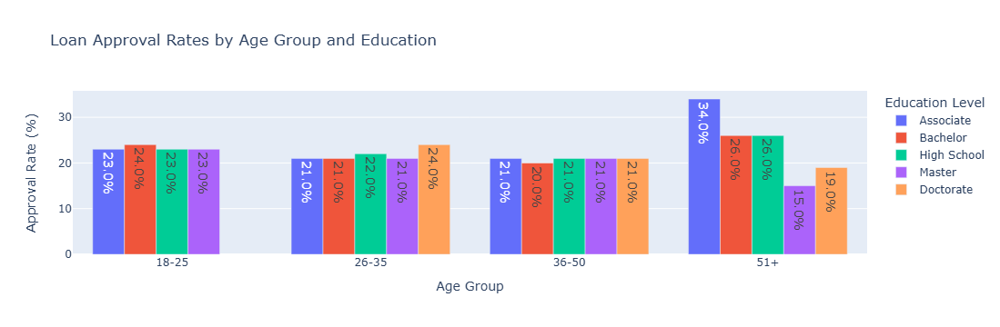

In [46]:
fig = px.bar(
    approval_rates,
    x='grouped_age',
    y='Approval_Rate',
    color='person_education',
    title="Loan Approval Rates by Age Group and Education",
    labels={'Approval_Rate': 'Approval Rate (%)', 'grouped_age': 'Age Group'},
    barmode='group',
    color_continuous_scale='turbo',
    text='Approval_Rate'  # Add text labels
)

fig.update_traces(texttemplate='%{text:.1f}%', textfont_size=14)  # Adjust text size and format
fig.update_layout(
    xaxis_title="Age Group",
    yaxis_title="Approval Rate (%)",
    legend_title="Education Level"
)

fig.show()

## 10) What are the Approval Rates for Income_Group and Age_Group?

In [47]:
grouped = df.groupby(['grouped_age', 'income_group'])['loan_status']

# Calculate approval rate (assuming 'Yes' and 'No' in Loan_Status)
approval_rates = grouped.apply(lambda x: (x == 'Yes').mean() * 100).reset_index(name='Approval_Rate').round()
approval_rates['Approval_Rate'] = approval_rates['Approval_Rate']

In [48]:
approval_rates

,grouped_age,income_group,Approval_Rate
0,18-25,High,5.0
1,18-25,Low,39.0
2,18-25,Medium,16.0
3,26-35,High,12.0
4,26-35,Low,38.0
5,26-35,Medium,16.0
6,26-35,Very High,0.0
7,36-50,High,10.0
8,36-50,Low,33.0
9,36-50,Medium,17.0


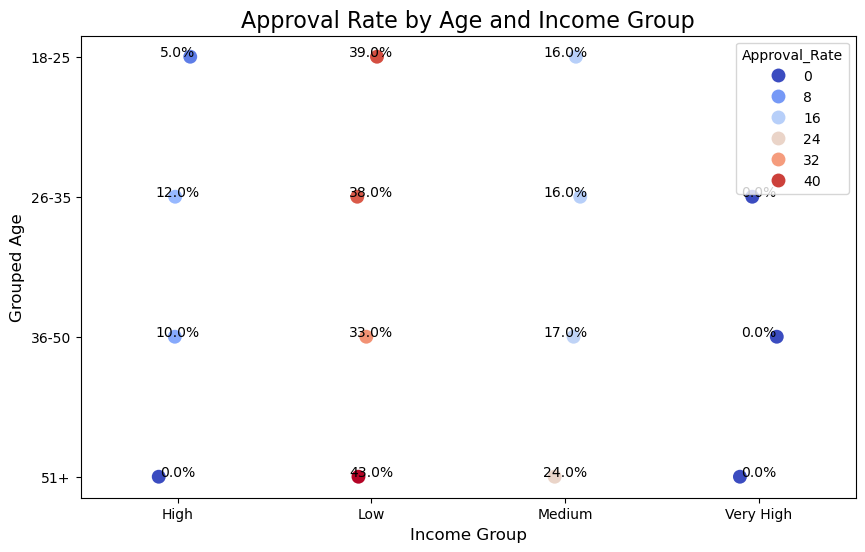

In [49]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
sns.stripplot(data=approval_rates, 
              x='income_group', 
              y='grouped_age', 
              hue='Approval_Rate', 
              palette='coolwarm', 
              jitter=True, 
              size=10)

# Title and axis labels
plt.title('Approval Rate by Age and Income Group', fontsize=16)
plt.xlabel('Income Group', fontsize=12)
plt.ylabel('Grouped Age', fontsize=12)

# Add labels to each point (ball) with approval rate
for line in range(0, len(approval_rates)):
    plt.text(approval_rates.income_group[line], approval_rates.grouped_age[line], 
             f'{approval_rates.Approval_Rate[line]:.1f}%', 
             horizontalalignment='center', 
             size=10, color='black')

plt.show()


## 11) What are the Approval Rates for Group_Age and Employment_Category?

In [50]:
grouped = df.groupby(['grouped_age', 'employment_category'])['loan_status']

# Calculate approval rate (assuming 'Yes' and 'No' in Loan_Status)
approval_rates = grouped.apply(lambda x: (x == 'Yes').mean() * 100).reset_index(name='Approval_Rate').round()
approval_rates['Approval_Rate'] = approval_rates['Approval_Rate']

In [51]:
approval_rates

,grouped_age,employment_category,Approval_Rate
0,18-25,Early Career,23.0
1,18-25,Entry-Level,24.0
2,26-35,Early Career,21.0
3,26-35,Entry-Level,22.0
4,26-35,Mid-Level,21.0
5,26-35,Senior-Level,21.0
6,36-50,Early Career,100.0
7,36-50,Mid-Level,21.0
8,36-50,Senior-Level,20.0
9,36-50,Veteran,24.0


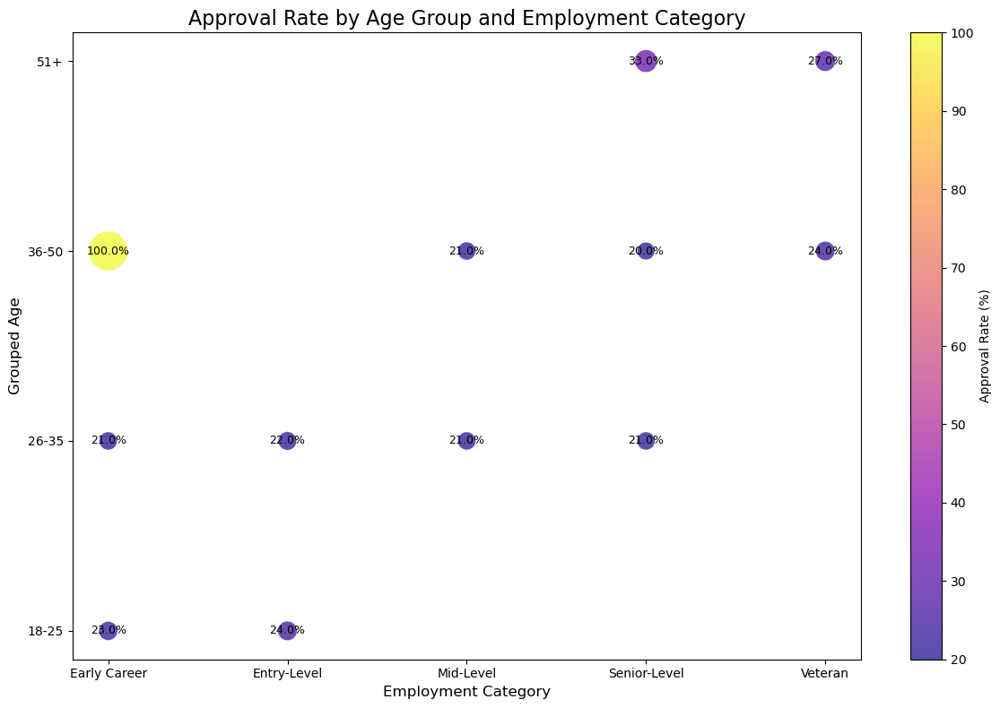

In [52]:
import matplotlib.pyplot as plt

# Create a bubble chart
plt.figure(figsize=(12, 8))

# Size of the bubbles based on the approval rate
plt.scatter(x=approval_rates['employment_category'], 
            y=approval_rates['grouped_age'], 
            s=approval_rates['Approval_Rate'] * 10,  # Scale bubble size
            c=approval_rates['Approval_Rate'], 
            cmap='plasma', alpha=0.7, edgecolors="w", linewidth=0.5)

# Add labels to each bubble
for i in range(len(approval_rates)):
    plt.text(approval_rates['employment_category'].iloc[i], 
             approval_rates['grouped_age'].iloc[i], 
             f"{approval_rates['Approval_Rate'].iloc[i]:.1f}%", 
             ha='center', va='center', fontsize=9, color='black')

# Title and labels
plt.title('Approval Rate by Age Group and Employment Category', fontsize=16)
plt.xlabel('Employment Category', fontsize=12)
plt.ylabel('Grouped Age', fontsize=12)

# Add a colorbar with a descriptive label
plt.colorbar(label='Approval Rate (%)')
plt.tight_layout()

plt.show()


## 12) What are the Approval rates for Income_Group and Employment_Category?

In [53]:
grouped = df.groupby(['income_group', 'employment_category'])['loan_status']

# Calculate approval rate (assuming 'Yes' and 'No' in Loan_Status)
approval_rates = grouped.apply(lambda x: (x == 'Yes').mean() * 100).reset_index(name='Approval_Rate').round()
approval_rates['Approval_Rate'] = approval_rates['Approval_Rate']

In [54]:
approval_rates

,income_group,employment_category,Approval_Rate
0,High,Early Career,13.0
1,High,Entry-Level,6.0
2,High,Mid-Level,12.0
3,High,Senior-Level,10.0
4,High,Veteran,0.0
5,Low,Early Career,38.0
6,Low,Entry-Level,39.0
7,Low,Mid-Level,38.0
8,Low,Senior-Level,32.0
9,Low,Veteran,45.0


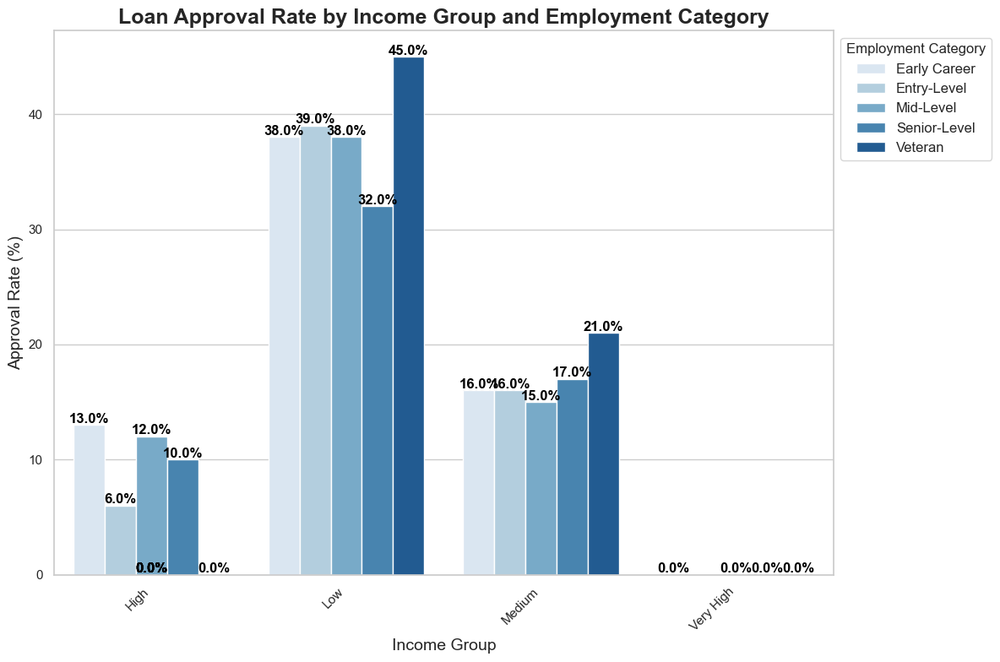

In [55]:

# Create a professional-looking bar chart
plt.figure(figsize=(12, 8))
sns.set_theme(style="whitegrid")

# Create the bar chart
ax = sns.barplot(
    data=approval_rates,
    x='income_group',
    y='Approval_Rate',
    hue='employment_category',
    palette='Blues',  # Use a clean, professional color palette
    ci=None  # Remove the confidence interval for cleaner presentation
)

# Customize the plot for clarity and professionalism
ax.set_title('Loan Approval Rate by Income Group and Employment Category', fontsize=18, weight='bold')
ax.set_xlabel('Income Group', fontsize=14)
ax.set_ylabel('Approval Rate (%)', fontsize=14)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')  # Rotate x labels for readability

# Add data labels for a professional touch
for p in ax.patches:
    ax.annotate(f'{p.get_height():.1f}%', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=12, color='black', weight='bold', xytext=(0, 5), textcoords='offset points')

# Adjust legend
plt.legend(title='Employment Category', loc='upper left', bbox_to_anchor=(1, 1), fontsize=12)

# Tight layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

## 13) What are the Approval Rates for Person_Education and Employment_Category?

In [56]:
grouped = df.groupby(['person_education', 'employment_category'])['loan_status']

# Calculate approval rate (assuming 'Yes' and 'No' in Loan_Status)
approval_rates = grouped.apply(lambda x: (x == 'Yes').mean() * 100).reset_index(name='Approval_Rate').round()
approval_rates['Approval_Rate'] = approval_rates['Approval_Rate']

In [57]:
approval_rates

,person_education,employment_category,Approval_Rate
0,Associate,Early Career,21.0
1,Associate,Entry-Level,23.0
2,Associate,Mid-Level,21.0
3,Associate,Senior-Level,20.0
4,Associate,Veteran,32.0
5,Bachelor,Early Career,23.0
6,Bachelor,Entry-Level,23.0
7,Bachelor,Mid-Level,21.0
8,Bachelor,Senior-Level,20.0
9,Bachelor,Veteran,21.0


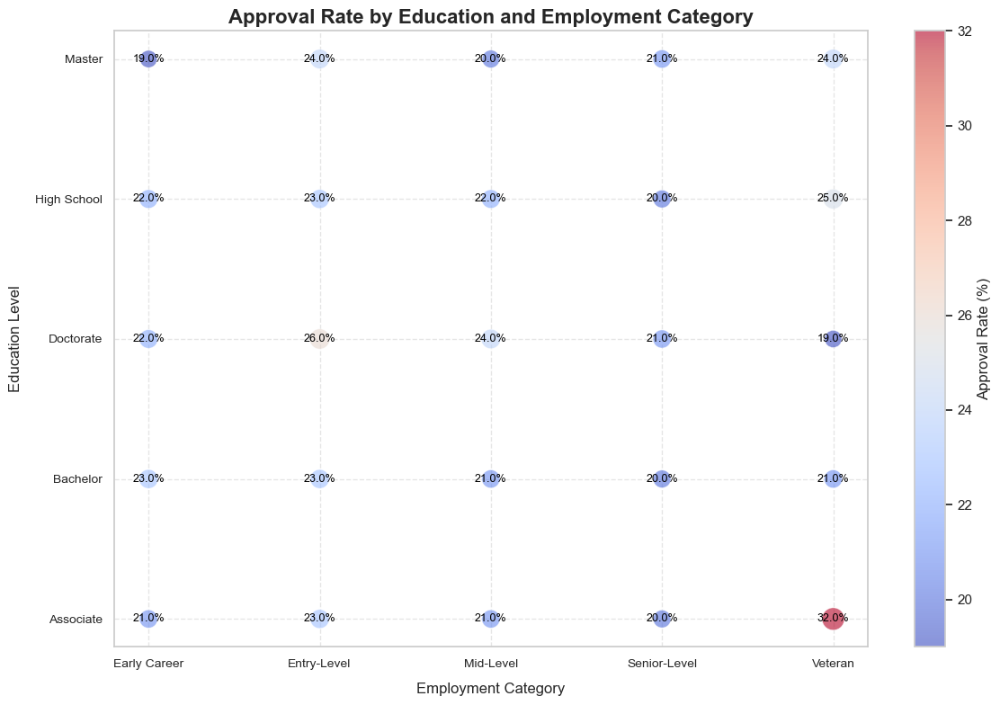

In [58]:
# Create a bubble chart
plt.figure(figsize=(12, 8))

# Rescale bubble sizes (adjust scaling factor for visibility)
bubble_sizes = approval_rates['Approval_Rate'] * 10  # Scale factor to make sizes proportional and visible

# Create scatter plot
plt.scatter(x=approval_rates['employment_category'], 
            y=approval_rates['person_education'], 
            s=bubble_sizes,  # Use scaled sizes
            c=approval_rates['Approval_Rate'], 
            cmap='coolwarm', alpha=0.6, edgecolors="w", linewidth=0.5)

# Add labels to each bubble
for i in range(len(approval_rates)):
    plt.text(approval_rates['employment_category'].iloc[i], 
             approval_rates['person_education'].iloc[i], 
             f"{approval_rates['Approval_Rate'].iloc[i]:.1f}%", 
             ha='center', va='center', fontsize=9, color='black')

# Title and labels
plt.title('Approval Rate by Education and Employment Category', fontsize=16, fontweight='bold')
plt.xlabel('Employment Category', fontsize=12, labelpad=10)
plt.ylabel('Education Level', fontsize=12, labelpad=10)

# Add a color bar
plt.colorbar(label='Approval Rate (%)')

# Final adjustments
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.grid(axis='both', linestyle='--', alpha=0.5)
plt.tight_layout()

plt.show()


## 14) What are the Approval Rate for Employment Category and Person_home_ownership?

In [59]:
other_count = df[df['person_home_ownership'] == 'OTHER']

In [60]:
other_count

,person_age,person_gender,person_education,person_income,person_emp_exp,person_home_ownership,loan_amnt,loan_intent,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,credit_score,previous_loan_defaults_on_file,loan_status,grouped_age,income_group,employment_category
29,21,female,Bachelor,14988.0,0,OTHER,4000.0,EDUCATION,12.84,0.27,2.0,553,No,Yes,18-25,Low,Entry-Level
564,26,female,Associate,24183.0,5,OTHER,7500.0,PERSONAL,11.97,0.31,2.0,621,No,Yes,26-35,Low,Early Career
712,24,female,Bachelor,25826.0,4,OTHER,6000.0,PERSONAL,12.21,0.23,2.0,655,No,No,18-25,Low,Early Career
876,21,male,Associate,28319.0,0,OTHER,2400.0,EDUCATION,12.21,0.08,4.0,628,Yes,No,18-25,Low,Entry-Level
1304,22,male,Associate,31844.0,0,OTHER,3000.0,DEBTCONSOLIDATION,9.45,0.09,3.0,560,No,No,18-25,Low,Entry-Level
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43140,26,female,Associate,71556.0,3,OTHER,12000.0,MEDICAL,12.57,0.17,4.0,632,No,Yes,26-35,Medium,Entry-Level
44410,25,male,High School,71842.0,2,OTHER,12000.0,MEDICAL,13.23,0.17,3.0,660,No,Yes,18-25,Medium,Entry-Level
44415,28,female,Associate,88047.0,2,OTHER,25000.0,MEDICAL,15.01,0.28,4.0,576,No,Yes,26-35,Medium,Entry-Level
44483,24,female,Master,71536.0,0,OTHER,12000.0,MEDICAL,17.28,0.17,2.0,650,No,Yes,18-25,Medium,Entry-Level


In [61]:
# Reassign "Other" based on income and age
df.loc[(df['person_home_ownership'] == 'OTHER') & (df['income_group']== 'Low') & (df['grouped_age']== '18-25'), 'person_home_ownership'] = 'RENT'
df.loc[(df['person_home_ownership'] == 'OTHER') & (df['income_group'] == 'Medium') & (df['grouped_age']== '26-35'), 'person_home_ownership'] = 'MORTGAGE'
df.loc[(df['person_home_ownership'] == 'OTHER') & (df['income_group'] == 'High') & (df['grouped_age'] == '36-50'), 'person_home_ownership'] = 'OWN'
df.loc[(df['person_home_ownership'] == 'OTHER') & (df['income_group'] == 'Very High') & (df['grouped_age'] == '51+'), 'person_home_ownership'] = 'OWN'


In [62]:
other_count = df[df['person_home_ownership'] == 'OTHER']
other_count

,person_age,person_gender,person_education,person_income,person_emp_exp,person_home_ownership,loan_amnt,loan_intent,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,credit_score,previous_loan_defaults_on_file,loan_status,grouped_age,income_group,employment_category
564,26,female,Associate,24183.0,5,OTHER,7500.0,PERSONAL,11.97,0.31,2.0,621,No,Yes,26-35,Low,Early Career
2347,26,male,Associate,39462.0,2,OTHER,6500.0,VENTURE,11.01,0.16,4.0,614,No,No,26-35,Low,Entry-Level
4839,21,female,Bachelor,51484.0,0,OTHER,12000.0,DEBTCONSOLIDATION,14.26,0.23,4.0,625,No,No,18-25,Medium,Entry-Level
4912,21,male,High School,51803.0,0,OTHER,7000.0,EDUCATION,14.61,0.14,2.0,565,No,No,18-25,Medium,Entry-Level
5197,24,male,Bachelor,54254.0,0,OTHER,10000.0,MEDICAL,13.22,0.18,4.0,621,Yes,No,18-25,Medium,Entry-Level
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38566,24,male,Associate,85430.0,4,OTHER,9000.0,PERSONAL,10.77,0.11,4.0,637,No,No,18-25,Medium,Early Career
42976,38,male,Associate,58841.0,14,OTHER,19057.0,PERSONAL,15.01,0.32,16.0,582,No,Yes,36-50,Medium,Mid-Level
44410,25,male,High School,71842.0,2,OTHER,12000.0,MEDICAL,13.23,0.17,3.0,660,No,Yes,18-25,Medium,Entry-Level
44483,24,female,Master,71536.0,0,OTHER,12000.0,MEDICAL,17.28,0.17,2.0,650,No,Yes,18-25,Medium,Entry-Level


In [63]:
# Reassign "Other" based on education levels
df.loc[(df['person_home_ownership'] == 'OTHER') & (df['person_education'].isin(['High School', 'Associate'])), 'person_home_ownership'] = 'RENT'
df.loc[(df['person_home_ownership'] == 'OTHER') & (df['person_education'] == 'Bachelor'), 'person_home_ownership'] = 'MORTGAGE'
df.loc[(df['person_home_ownership'] == 'OTHER') & (df['person_education'].isin(['Master', 'Doctorate'])), 'person_home_ownership'] = 'OWN'


In [64]:
grouped = df.groupby(['person_home_ownership', 'employment_category'])['loan_status']

# Calculate approval rate (assuming 'Yes' and 'No' in Loan_Status)
approval_rates = grouped.apply(lambda x: (x == 'Yes').mean() * 100).reset_index(name='Approval_Rate').round()
approval_rates['Approval_Rate'] = approval_rates['Approval_Rate']

In [65]:
approval_rates

,person_home_ownership,employment_category,Approval_Rate
0,MORTGAGE,Early Career,11.0
1,MORTGAGE,Entry-Level,12.0
2,MORTGAGE,Mid-Level,12.0
3,MORTGAGE,Senior-Level,11.0
4,MORTGAGE,Veteran,17.0
5,OWN,Early Career,7.0
6,OWN,Entry-Level,8.0
7,OWN,Mid-Level,7.0
8,OWN,Senior-Level,7.0
9,OWN,Veteran,10.0


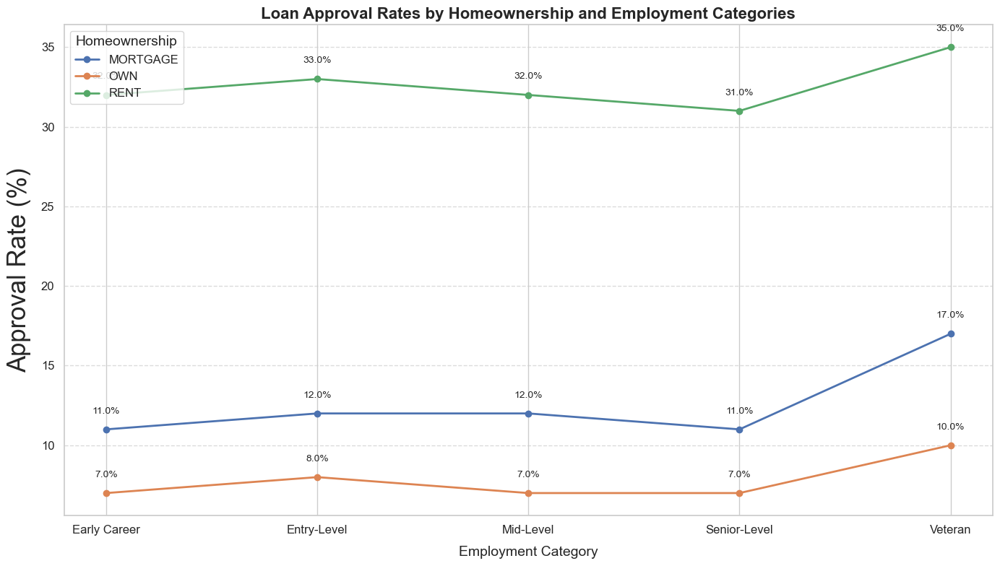

In [66]:
# Set the theme for a professional look
sns.set_theme(style="whitegrid")

# Pivot data for easier visualization
approval_rates_pivot = approval_rates.pivot(index='employment_category', columns='person_home_ownership', values='Approval_Rate')

# Create the plot
plt.figure(figsize=(14, 8))

# Plot each line for homeownership categories
for column in approval_rates_pivot.columns:
    plt.plot(approval_rates_pivot.index, approval_rates_pivot[column], marker='o', linewidth=2, label=column)

# Customize the plot
plt.title('Loan Approval Rates by Homeownership and Employment Categories', fontsize=16, fontweight='bold')
plt.xlabel('Employment Category', fontsize=14, labelpad=10)
plt.ylabel('Approval Rate (%)', fontsize=25, labelpad=10)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(title='Homeownership', fontsize=12, title_fontsize=14, loc='upper left')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Annotate each data point
for column in approval_rates_pivot.columns:
    for x, y in zip(approval_rates_pivot.index, approval_rates_pivot[column]):
        plt.text(x, y + 1, f"{y:.1f}%", ha='center', fontsize=10)

# Final adjustments
plt.tight_layout()
plt.show()


## what arre the approval rates for person_home_ownership?

In [67]:
Approval_Rate_Emp = df.groupby("person_home_ownership")["loan_status"].apply(lambda x: (x =="Yes").mean()*100).round().reset_index()
Approval_Rate_Emp

,person_home_ownership,loan_status
0,MORTGAGE,12.0
1,OWN,8.0
2,RENT,32.0


In [68]:
Approval_Rate_Emp.columns = ["person_home_ownership", "Approval_Rate_person_home_ownership"]

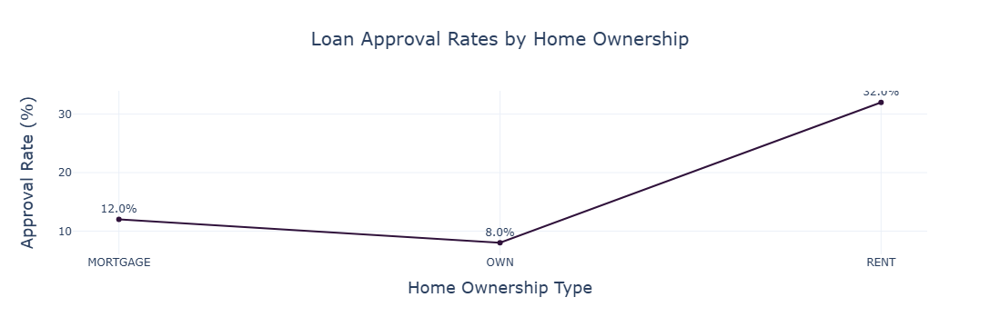

In [69]:
import plotly.express as px

# Create the line chart with labels
fig = px.line(
    Approval_Rate_Emp,
    x="person_home_ownership",
    y="Approval_Rate_person_home_ownership",
    title="Loan Approval Rates by Home Ownership",
    markers=True,
    color_discrete_sequence=px.colors.sequential.Turbo,
    text="Approval_Rate_person_home_ownership"  # Add labels
)

# Customize the text position and display
fig.update_traces(
    textposition="top center",  # Position labels above the line
    texttemplate="%{text:.1f}%"  # Format labels to show one decimal place with a percentage symbol
)

# Customize axis labels and chart layout
fig.update_layout(
    xaxis_title="Home Ownership Type",
    yaxis_title="Approval Rate (%)",
    title_font_size=20,
    xaxis_title_font_size=18,
    yaxis_title_font_size=18,
    template="plotly_white",
    title_x=0.5  # Center the title
)

# Show the chart
fig.show()


## what are the Approval rates for person_home_ownership and Income_Group?

In [70]:
grouped = df.groupby(['person_home_ownership', 'income_group'])['loan_status']

# Calculate approval rate (assuming 'Yes' and 'No' in Loan_Status)
approval_rates = grouped.apply(lambda x: (x == 'Yes').mean() * 100).reset_index(name='Approval_Rate').round()
approval_rates['Approval_Rate'] = approval_rates['Approval_Rate']

In [71]:
approval_rates

,person_home_ownership,income_group,Approval_Rate
0,MORTGAGE,High,10.0
1,MORTGAGE,Low,19.0
2,MORTGAGE,Medium,11.0
3,MORTGAGE,Very High,0.0
4,OWN,High,3.0
5,OWN,Low,15.0
6,OWN,Medium,2.0
7,OWN,Very High,0.0
8,RENT,High,12.0
9,RENT,Low,46.0


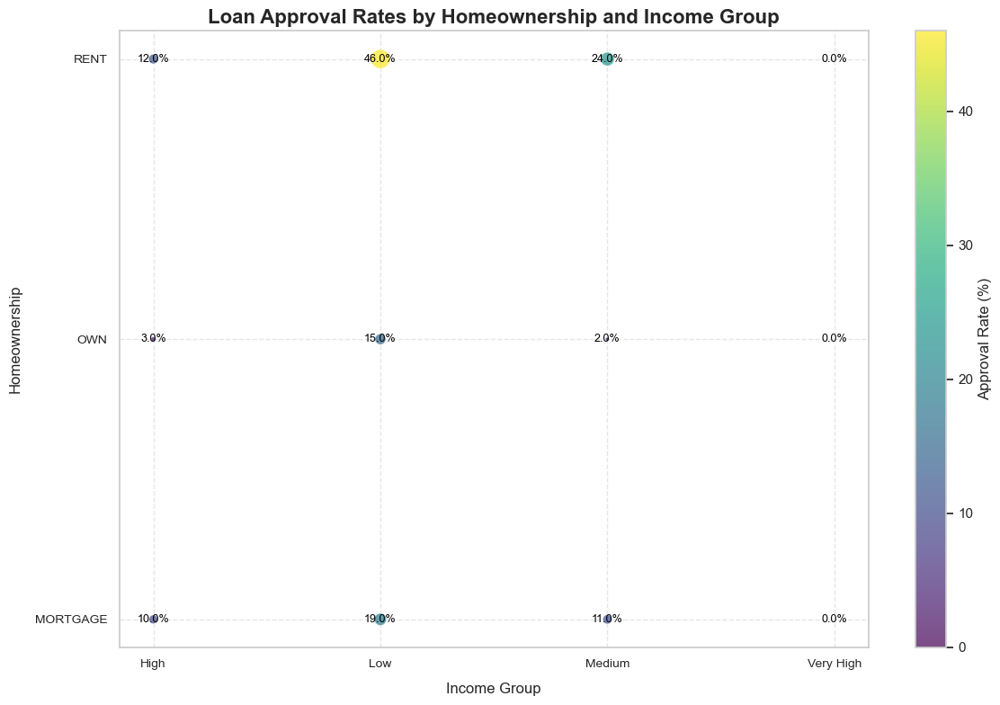

In [72]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the style for a professional look
sns.set_theme(style="whitegrid")

# Rescale bubble sizes for better visibility
bubble_sizes = approval_rates['Approval_Rate'] * 5  # Adjust size factor as needed

# Create the bubble chart
plt.figure(figsize=(12, 8))
scatter = plt.scatter(
    x=approval_rates['income_group'], 
    y=approval_rates['person_home_ownership'], 
    s=bubble_sizes,  # Bubble size
    c=approval_rates['Approval_Rate'],  # Bubble color
    cmap='viridis',  # Color map for bubbles
    alpha=0.7, edgecolors='w', linewidth=0.5
)

# Add annotations to bubbles
for i in range(len(approval_rates)):
    plt.text(
        approval_rates['income_group'].iloc[i], 
        approval_rates['person_home_ownership'].iloc[i], 
        f"{approval_rates['Approval_Rate'].iloc[i]:.1f}%", 
        ha='center', va='center', fontsize=9, color='black'
    )

# Add title and labels
plt.title('Loan Approval Rates by Homeownership and Income Group', fontsize=16, fontweight='bold')
plt.xlabel('Income Group', fontsize=12, labelpad=10)
plt.ylabel('Homeownership', fontsize=12, labelpad=10)

# Add a color bar to indicate approval rates
cbar = plt.colorbar(scatter)
cbar.set_label('Approval Rate (%)', fontsize=12)

# Final adjustments for professional appearance
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.grid(axis='both', linestyle='--', alpha=0.5)
plt.tight_layout()

# Show the plot
plt.show()


## 17) what are the Approval Rates for person_home_ownership and Grouped_age?

In [73]:
grouped = df.groupby(['person_home_ownership', 'grouped_age'])['loan_status']

# Calculate approval rate (assuming 'Yes' and 'No' in Loan_Status)
approval_rates = grouped.apply(lambda x: (x == 'Yes').mean() * 100).reset_index(name='Approval_Rate').round()
approval_rates['Approval_Rate'] = approval_rates['Approval_Rate']

In [74]:
approval_rates

,person_home_ownership,grouped_age,Approval_Rate
0,MORTGAGE,18-25,12.0
1,MORTGAGE,26-35,11.0
2,MORTGAGE,36-50,12.0
3,MORTGAGE,51+,15.0
4,OWN,18-25,8.0
5,OWN,26-35,7.0
6,OWN,36-50,8.0
7,OWN,51+,5.0
8,RENT,18-25,33.0
9,RENT,26-35,32.0


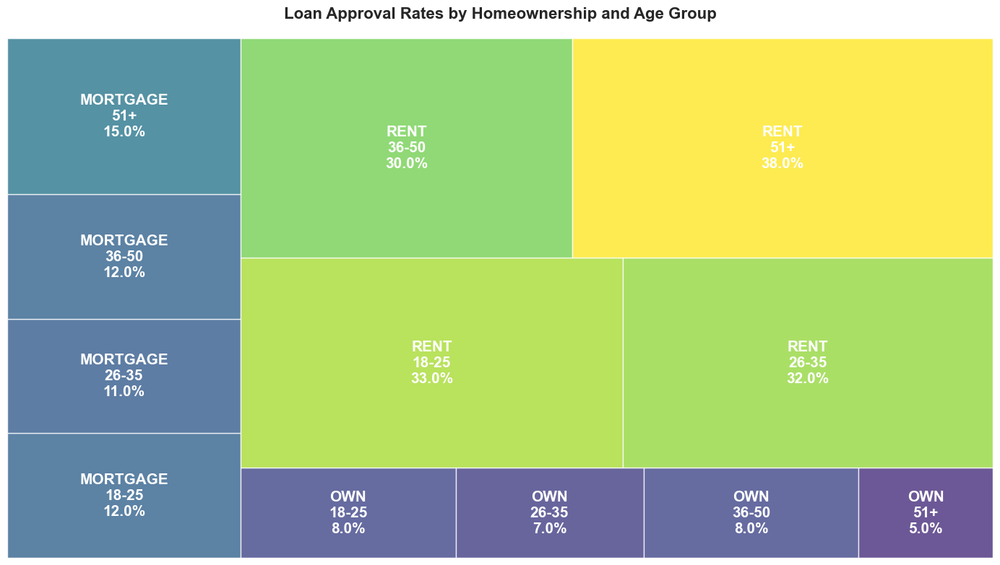

In [75]:
import squarify
import matplotlib.pyplot as plt
import numpy as np

# Replace zero or missing approval rates with a small value to avoid zero-area rectangles
approval_rates['Approval_Rate'] = approval_rates['Approval_Rate'].replace(0, 0.01)

# Prepare labels for the treemap
approval_rates['label'] = (
    approval_rates['person_home_ownership'] + "\n" +
    approval_rates['grouped_age'] + "\n" +
    approval_rates['Approval_Rate'].astype(str) + "%"
)

# Treemap sizes, labels, and colors
sizes = approval_rates['Approval_Rate']  # Rectangle sizes based on approval rate
labels = approval_rates['label']  # Text labels for each rectangle
colors = np.array(approval_rates['Approval_Rate'])  # Use approval rates for color intensity

# Create the treemap
plt.figure(figsize=(14, 8))
squarify.plot(
    sizes=sizes, 
    label=labels, 
    color=plt.cm.viridis(colors / max(colors)),  # Normalize colors by the maximum approval rate
    alpha=0.8, 
    text_kwargs={'fontsize': 15, 'color': 'white', 'weight': 'bold'}
)

# Add title
plt.title('Loan Approval Rates by Homeownership and Age Group', fontsize=16, fontweight='bold', pad=20)

# Remove axis for a clean and professional look
plt.axis('off')

# Display the chart
plt.tight_layout()
plt.show()


## 18)what are the Approval rates for loan_amount_Category and income_group?

In [76]:
# Percentile thresholds based on your data
percentile_25 = 5000
percentile_50 = 8000
percentile_75 = 12230
# Function to categorize loan amounts based on percentiles
def categorize_loan_amount(loan_amount):
    if loan_amount < percentile_25:
        return 'Low_Loan'
    elif percentile_25 <= loan_amount < percentile_50:
        return 'Medium_Loan'
    elif percentile_50 <= loan_amount < percentile_75:
        return 'High_Loan'
    else:
        return 'Very High_Loan'

# Apply the function to the 'loan_amnt' column
df['loan_amnt_category'] = df['loan_amnt'].apply(categorize_loan_amount)

In [77]:
grouped = df.groupby(['loan_amnt_category', 'income_group'])['loan_status']

# Calculate approval rate (assuming 'Yes' and 'No' in Loan_Status)
approval_rates = grouped.apply(lambda x: (x == 'Yes').mean() * 100).reset_index(name='Approval_Rate').round()
approval_rates['Approval_Rate'] = approval_rates['Approval_Rate']

In [78]:
approval_rates

,loan_amnt_category,income_group,Approval_Rate
0,High_Loan,High,10.0
1,High_Loan,Low,48.0
2,High_Loan,Medium,11.0
3,High_Loan,Very High,0.0
4,Low_Loan,High,3.0
5,Low_Loan,Low,32.0
6,Low_Loan,Medium,11.0
7,Low_Loan,Very High,0.0
8,Medium_Loan,High,5.0
9,Medium_Loan,Low,29.0


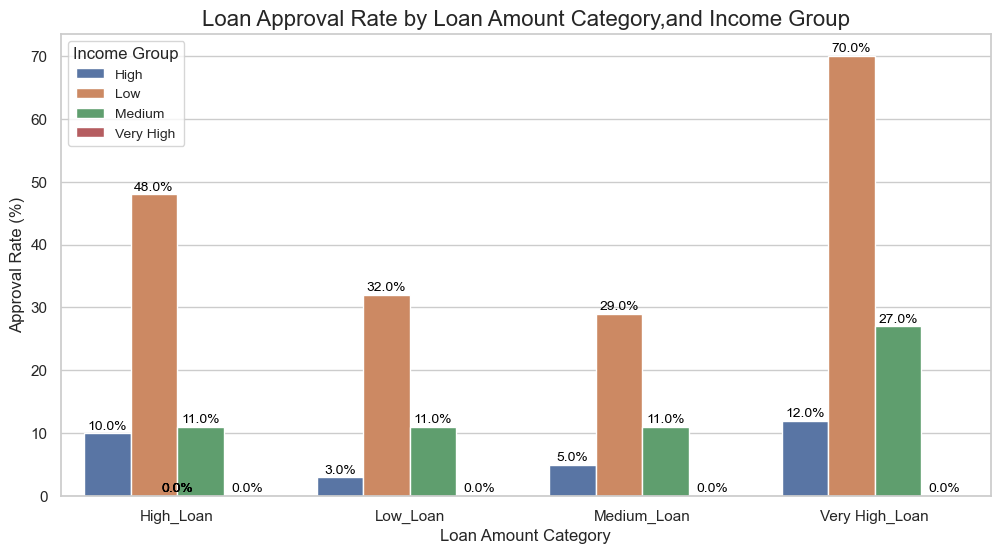

In [79]:
# Set the figure size
plt.figure(figsize=(12, 6))

# Create a bar chart with multi-level hue (both person_home_ownership and income_group)
ax = sns.barplot(x='loan_amnt_category', y='Approval_Rate', hue='income_group', data=approval_rates, ci=None, dodge=True)

# Add title and labels
plt.title('Loan Approval Rate by Loan Amount Category,and Income Group', fontsize=16)
plt.xlabel('Loan Amount Category', fontsize=12)
plt.ylabel('Approval Rate (%)', fontsize=12)
plt.legend(title='Income Group', fontsize=10)

# Add labels on top of bars
for p in ax.patches:
    ax.annotate(f'{p.get_height():.1f}%', 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', fontsize=10, color='black', xytext=(0, 5), textcoords='offset points')

# Display the plot
plt.show()

In [80]:
Approval_Rate_Emp = df.groupby("loan_amnt_category")["loan_status"].apply(lambda x: (x =="Yes").mean()*100).round().reset_index()
Approval_Rate_Emp

,loan_amnt_category,loan_status
0,High_Loan,20.0
1,Low_Loan,21.0
2,Medium_Loan,17.0
3,Very High_Loan,30.0


In [81]:
Approval_Rate_Emp.columns = ["loan_amnt_category", "Approval_Rate_Loans_Categories"]

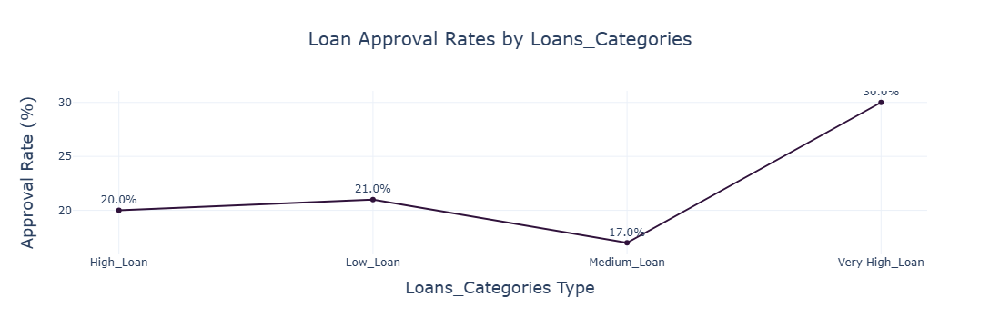

In [82]:
# Create the line chart with labels
fig = px.line(
    Approval_Rate_Emp,
    x="loan_amnt_category",
    y="Approval_Rate_Loans_Categories",
    title="Loan Approval Rates by Loans_Categories",
    markers=True,
    color_discrete_sequence=px.colors.sequential.Turbo,
    text="Approval_Rate_Loans_Categories"  # Add labels
)

# Customize the text position and display
fig.update_traces(
    textposition="top center",  # Position labels above the line
    texttemplate="%{text:.1f}%"  # Format labels to show one decimal place with a percentage symbol
)

# Customize axis labels and chart layout
fig.update_layout(
    xaxis_title="Loans_Categories Type",
    yaxis_title="Approval Rate (%)",
    title_font_size=20,
    xaxis_title_font_size=18,
    yaxis_title_font_size=18,
    template="plotly_white",
    title_x=0.5  # Center the title
)

# Show the chart
fig.show()


## what are the Approval rates for loan_amount_Category and person_home_ownership?

In [83]:
grouped = df.groupby(['loan_amnt_category', 'person_home_ownership'])['loan_status']

# Calculate approval rate (assuming 'Yes' and 'No' in Loan_Status)
approval_rates = grouped.apply(lambda x: (x == 'Yes').mean() * 100).reset_index(name='Approval_Rate').round()
approval_rates['Approval_Rate'] = approval_rates['Approval_Rate']

In [84]:
approval_rates

,loan_amnt_category,person_home_ownership,Approval_Rate
0,High_Loan,MORTGAGE,10.0
1,High_Loan,OWN,2.0
2,High_Loan,RENT,30.0
3,Low_Loan,MORTGAGE,11.0
4,Low_Loan,OWN,15.0
5,Low_Loan,RENT,27.0
6,Medium_Loan,MORTGAGE,11.0
7,Medium_Loan,OWN,9.0
8,Medium_Loan,RENT,23.0
9,Very High_Loan,MORTGAGE,14.0


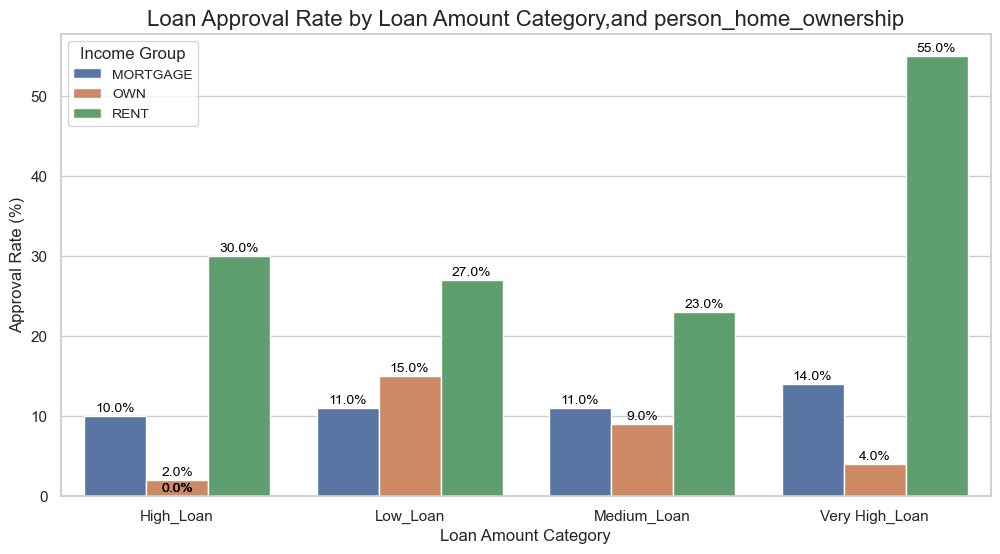

In [85]:
# Set the figure size
plt.figure(figsize=(12, 6))

# Create a bar chart with multi-level hue (both person_home_ownership and income_group)
ax = sns.barplot(x='loan_amnt_category', y='Approval_Rate', hue='person_home_ownership', data=approval_rates, ci=None, dodge=True)

# Add title and labels
plt.title('Loan Approval Rate by Loan Amount Category,and person_home_ownership', fontsize=16)
plt.xlabel('Loan Amount Category', fontsize=12)
plt.ylabel('Approval Rate (%)', fontsize=12)
plt.legend(title='Income Group', fontsize=10)

# Add labels on top of bars
for p in ax.patches:
    ax.annotate(f'{p.get_height():.1f}%', 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', fontsize=10, color='black', xytext=(0, 5), textcoords='offset points')

# Display the plot
plt.show()

##  what are the Approval Rate for the Intentions of Persons?

In [86]:
grouped = df.groupby(['loan_intent'])['loan_status']

# Calculate approval rate (assuming 'Yes' and 'No' in Loan_Status)
approval_rates = grouped.apply(lambda x: (x == 'Yes').mean() * 100).reset_index(name='Approval_Rate').round()
approval_rates['Approval_Rate'] = approval_rates['Approval_Rate']

In [87]:
approval_rates

,loan_intent,Approval_Rate
0,DEBTCONSOLIDATION,30.0
1,EDUCATION,17.0
2,HOMEIMPROVEMENT,26.0
3,MEDICAL,28.0
4,PERSONAL,20.0
5,VENTURE,14.0


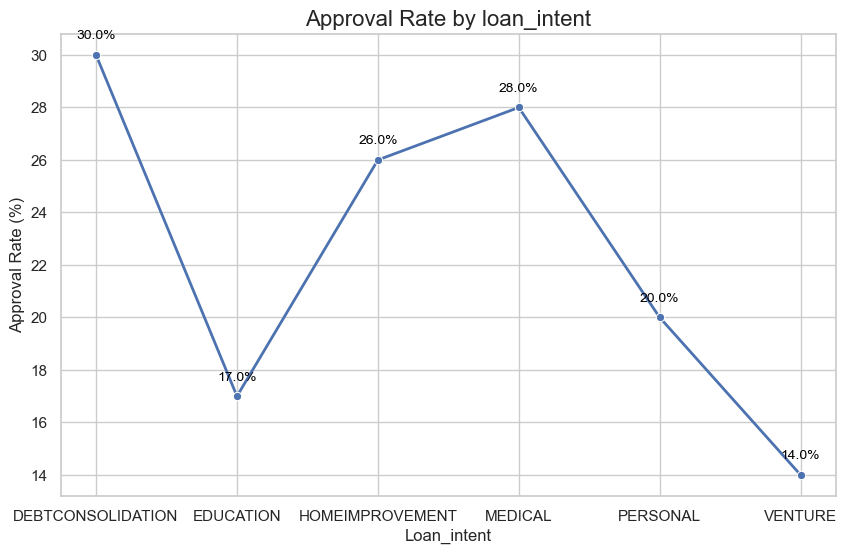

In [88]:
# Create the line chart
plt.figure(figsize=(10, 6))
sns.lineplot(data=approval_rates, x='loan_intent', y='Approval_Rate', marker='o', linewidth=2)

# Add data labels
for i, row in approval_rates.iterrows():
    plt.text(row['loan_intent'], row['Approval_Rate'] + 0.5, 
             f"{row['Approval_Rate']}%", 
             ha='center', va='bottom', fontsize=10, color='black')

# Title and labels
plt.title('Approval Rate by loan_intent', fontsize=16)
plt.xlabel('Loan_intent', fontsize=12)
plt.ylabel('Approval Rate (%)', fontsize=12)

# Show the plot
plt.show()

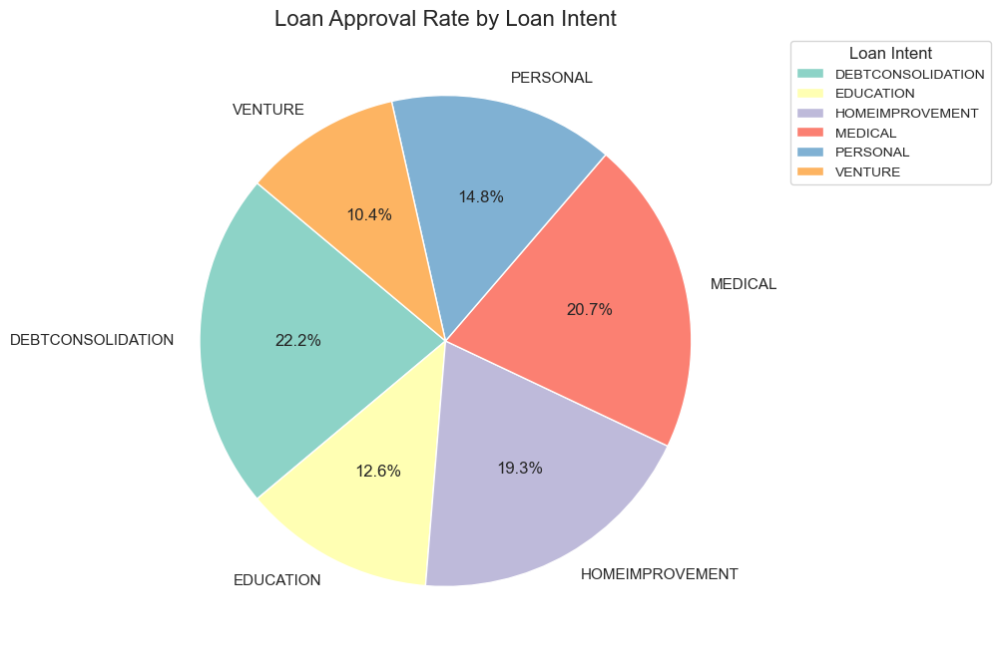

In [89]:
# Set the figure size
plt.figure(figsize=(8, 8))

# Extract Set3 colors from Seaborn palette
set3_colors = sns.color_palette("Set3", n_colors=len(approval_rates['loan_intent']))

# Create a pie chart
plt.pie(
    approval_rates['Approval_Rate'], 
    labels=approval_rates['loan_intent'], 
    autopct='%1.1f%%', 
    startangle=140, 
    colors=set3_colors  # Apply Set3 colors
)

# Add title
plt.title('Loan Approval Rate by Loan Intent', fontsize=16)

# Add a legend on the right side, adjusted with bbox_to_anchor
plt.legend(
    approval_rates['loan_intent'], 
    title="Loan Intent", 
    loc="upper left", 
    fontsize=10, 
    bbox_to_anchor=(1.05, 1)
)

# Display the plot
plt.show()

## what are the Approval Rates for loan_intent,income_group?

In [90]:
grouped = df.groupby(['loan_intent', 'income_group'])['loan_status']

# Calculate approval rate (assuming 'Yes' and 'No' in Loan_Status)
approval_rates = grouped.apply(lambda x: (x == 'Yes').mean() * 100).reset_index(name='Approval_Rate').round()
approval_rates['Approval_Rate'] = approval_rates['Approval_Rate']

In [91]:
approval_rates

,loan_intent,income_group,Approval_Rate
0,DEBTCONSOLIDATION,High,20.0
1,DEBTCONSOLIDATION,Low,46.0
2,DEBTCONSOLIDATION,Medium,24.0
3,DEBTCONSOLIDATION,Very High,0.0
4,EDUCATION,High,7.0
5,EDUCATION,Low,31.0
6,EDUCATION,Medium,11.0
7,EDUCATION,Very High,0.0
8,HOMEIMPROVEMENT,High,7.0
9,HOMEIMPROVEMENT,Low,66.0


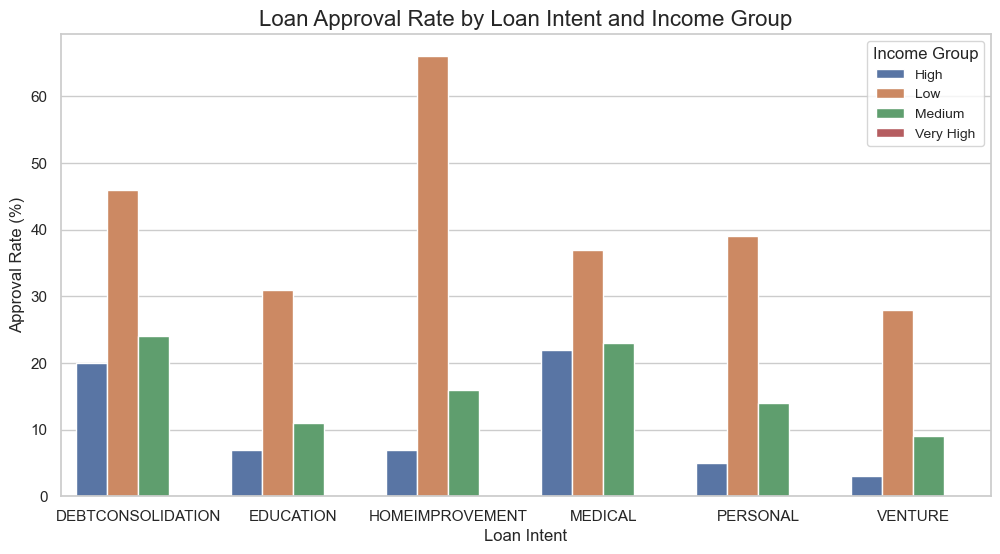

In [92]:
# Set the figure size
plt.figure(figsize=(12, 6))

# Create a clustered bar chart with seaborn
sns.barplot(x='loan_intent', y='Approval_Rate', hue='income_group', data=approval_rates, ci=None)

# Add title and labels
plt.title('Loan Approval Rate by Loan Intent and Income Group', fontsize=16)
plt.xlabel('Loan Intent', fontsize=12)
plt.ylabel('Approval Rate (%)', fontsize=12)
plt.legend(title='Income Group', fontsize=10)

# Display the plot
plt.show()

## 21) what are the Approval Rates for loan_intent,person_home_ownership?

In [93]:
grouped = df.groupby(['loan_intent', 'person_home_ownership'])['loan_status']

# Calculate approval rate (assuming 'Yes' and 'No' in Loan_Status)
approval_rates = grouped.apply(lambda x: (x == 'Yes').mean() * 100).reset_index(name='Approval_Rate').round()
approval_rates['Approval_Rate'] = approval_rates['Approval_Rate']

In [94]:
approval_rates

,loan_intent,person_home_ownership,Approval_Rate
0,DEBTCONSOLIDATION,MORTGAGE,19.0
1,DEBTCONSOLIDATION,OWN,34.0
2,DEBTCONSOLIDATION,RENT,39.0
3,EDUCATION,MORTGAGE,7.0
4,EDUCATION,OWN,6.0
5,EDUCATION,RENT,26.0
6,HOMEIMPROVEMENT,MORTGAGE,13.0
7,HOMEIMPROVEMENT,OWN,12.0
8,HOMEIMPROVEMENT,RENT,44.0
9,MEDICAL,MORTGAGE,20.0


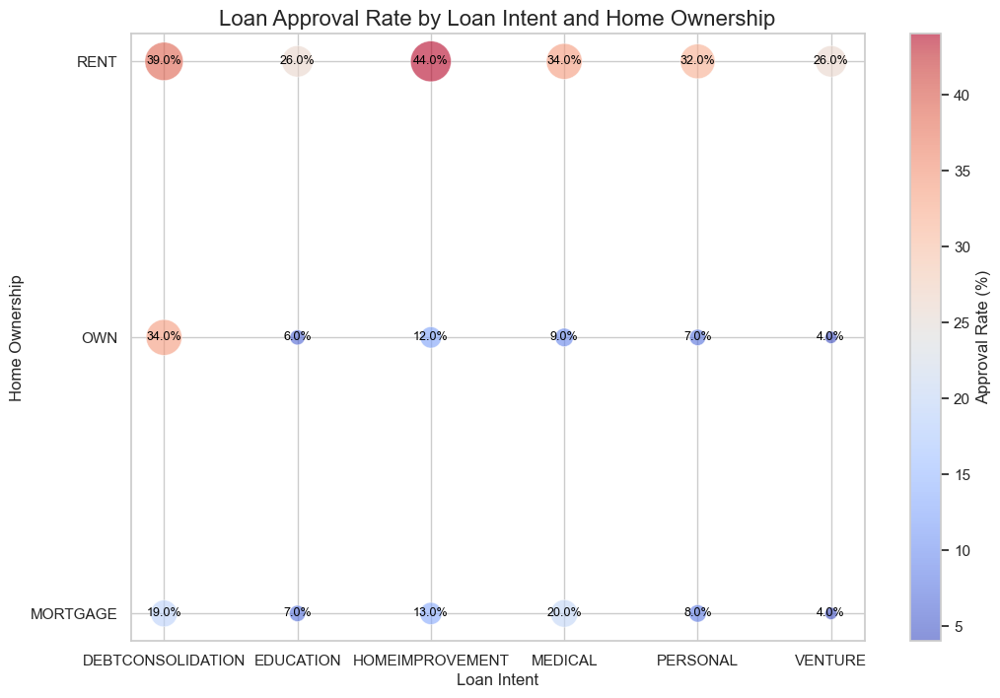

In [95]:
# Set the figure size
plt.figure(figsize=(12, 8))

# Size of the bubbles based on the approval rate
plt.scatter(x=approval_rates['loan_intent'], 
            y=approval_rates['person_home_ownership'], 
            s=approval_rates['Approval_Rate'] * 20,  # Scale bubble size
            c=approval_rates['Approval_Rate'], 
            cmap='coolwarm', alpha=0.6, edgecolors="w", linewidth=0.5)

# Add labels to each bubble
for i in range(len(approval_rates)):
    plt.text(approval_rates['loan_intent'].iloc[i], 
             approval_rates['person_home_ownership'].iloc[i], 
             f"{approval_rates['Approval_Rate'].iloc[i]:.1f}%", 
             ha='center', va='center', fontsize=9, color='black')

# Title and labels
plt.title('Loan Approval Rate by Loan Intent and Home Ownership', fontsize=16)
plt.xlabel('Loan Intent', fontsize=12)
plt.ylabel('Home Ownership', fontsize=12)

plt.colorbar(label='Approval Rate (%)')
plt.show()

## 21) what are the intentions of persons over thier genders?

In [96]:
# Group by loan intent and person gender, then count the occurrences
gender_counts = df.groupby(['loan_intent', 'person_gender'])['person_gender'].count().reset_index(name='count')
gender_counts

,loan_intent,person_gender,count
0,DEBTCONSOLIDATION,female,3169
1,DEBTCONSOLIDATION,male,3971
2,EDUCATION,female,4076
3,EDUCATION,male,5068
4,HOMEIMPROVEMENT,female,2139
5,HOMEIMPROVEMENT,male,2641
6,MEDICAL,female,3880
7,MEDICAL,male,4645
8,PERSONAL,female,3392
9,PERSONAL,male,4140


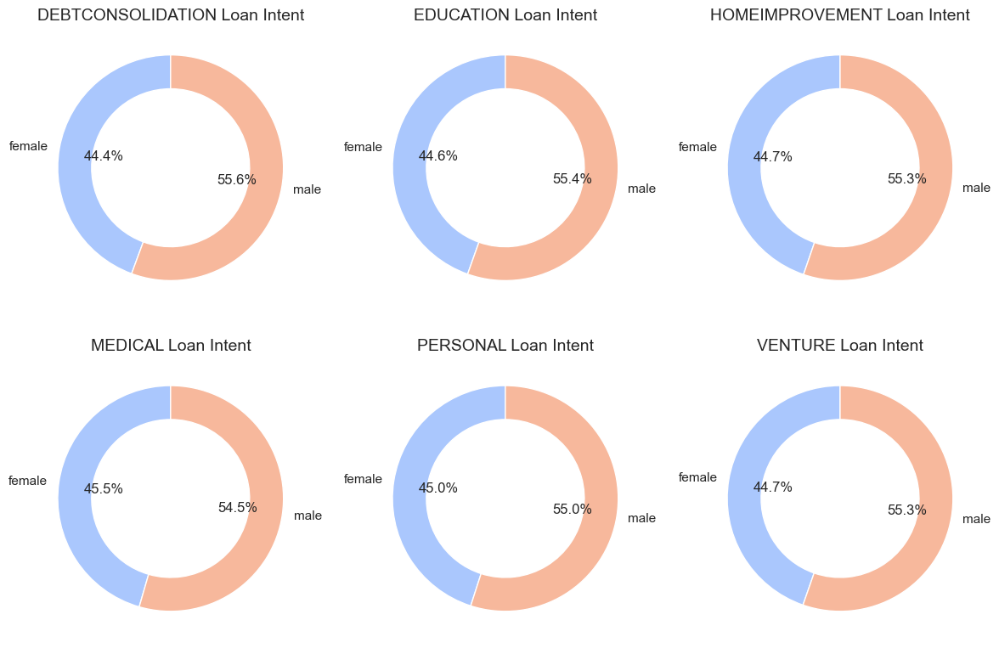

In [97]:
# Set the figure size
plt.figure(figsize=(12, 8))

# Plot donut charts for each loan intent
for i, intent in enumerate(gender_counts['loan_intent'].unique()):
    # Subset data for each loan intent
    intent_data = gender_counts[gender_counts['loan_intent'] == intent]
    
    # Plot each donut chart
    plt.subplot(2, 3, i+1)  # Adjust the number of subplots based on loan intents
    sizes = intent_data['count']
    labels = intent_data['person_gender']
    
    # Create donut chart
    wedges, texts, autotexts = plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90, 
                                       wedgeprops=dict(width=0.3, edgecolor='w'), colors=sns.color_palette("coolwarm", len(labels)))
    
    # Title for each plot
    plt.title(f'{intent} Loan Intent', fontsize=14)

# Display the plot
plt.tight_layout()
plt.show()

## 22) what are the Approval rates for loan_Intent and Genders?

In [98]:
grouped = df.groupby(['loan_intent', 'person_gender'])['loan_status']

# Calculate approval rate (assuming 'Yes' and 'No' in Loan_Status)
approval_rates = grouped.apply(lambda x: (x == 'Yes').mean() * 100).reset_index(name='Approval_Rate').round()
approval_rates['Approval_Rate'] = approval_rates['Approval_Rate']

In [99]:
approval_rates

,loan_intent,person_gender,Approval_Rate
0,DEBTCONSOLIDATION,female,30.0
1,DEBTCONSOLIDATION,male,30.0
2,EDUCATION,female,17.0
3,EDUCATION,male,17.0
4,HOMEIMPROVEMENT,female,28.0
5,HOMEIMPROVEMENT,male,25.0
6,MEDICAL,female,28.0
7,MEDICAL,male,28.0
8,PERSONAL,female,20.0
9,PERSONAL,male,20.0


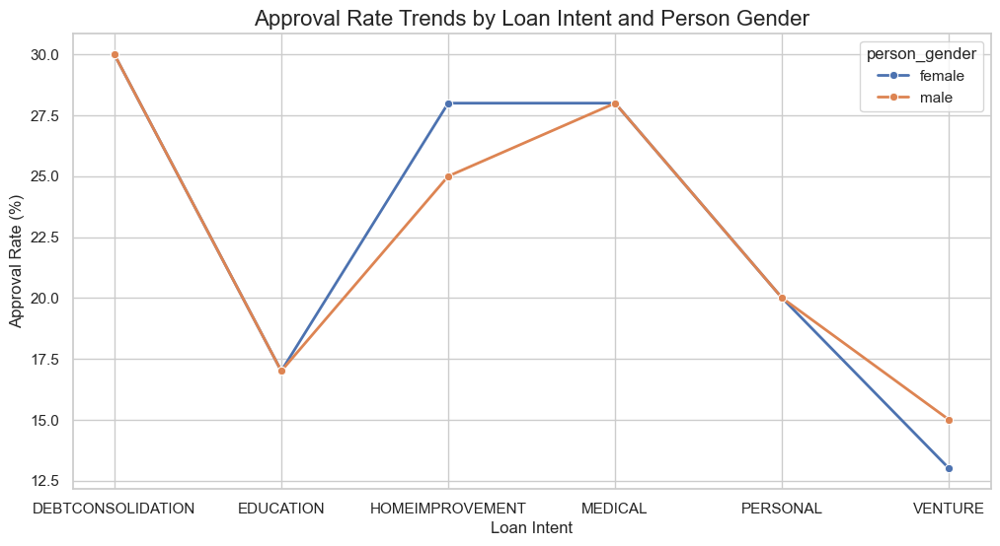

In [100]:
# Create a line plot
plt.figure(figsize=(12, 6))
sns.lineplot(data=approval_rates, x='loan_intent', y='Approval_Rate', hue='person_gender', marker='o', linewidth=2)

# Title and labels
plt.title('Approval Rate Trends by Loan Intent and Person Gender', fontsize=16)
plt.xlabel('Loan Intent', fontsize=12)
plt.ylabel('Approval Rate (%)', fontsize=12)

plt.show()

## 22) what are the Approval rates for loan_Intent and Person Educations?

In [101]:
grouped = df.groupby(['loan_intent', 'person_education'])['loan_status']

# Calculate approval rate (assuming 'Yes' and 'No' in Loan_Status)
approval_rates = grouped.apply(lambda x: (x == 'Yes').mean() * 100).reset_index(name='Approval_Rate').round()
approval_rates['Approval_Rate'] = approval_rates['Approval_Rate']

In [102]:
approval_rates

,loan_intent,person_education,Approval_Rate
0,DEBTCONSOLIDATION,Associate,30.0
1,DEBTCONSOLIDATION,Bachelor,30.0
2,DEBTCONSOLIDATION,Doctorate,34.0
3,DEBTCONSOLIDATION,High School,31.0
4,DEBTCONSOLIDATION,Master,30.0
5,EDUCATION,Associate,17.0
6,EDUCATION,Bachelor,17.0
7,EDUCATION,Doctorate,20.0
8,EDUCATION,High School,17.0
9,EDUCATION,Master,17.0


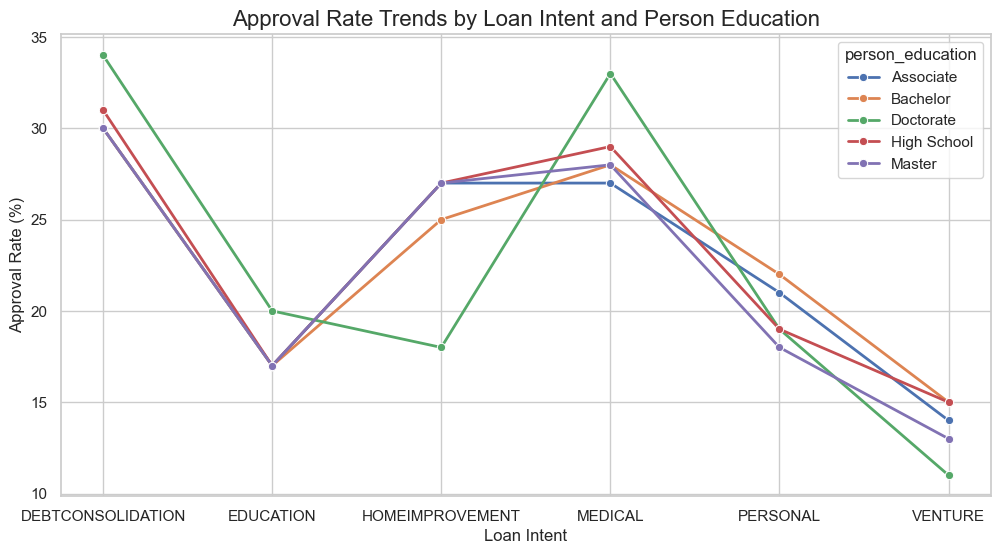

In [103]:
# Create a line plot
plt.figure(figsize=(12, 6))
sns.lineplot(data=approval_rates, x='loan_intent', y='Approval_Rate', hue='person_education', marker='o', linewidth=2)

# Title and labels
plt.title('Approval Rate Trends by Loan Intent and Person Education', fontsize=16)
plt.xlabel('Loan Intent', fontsize=12)
plt.ylabel('Approval Rate (%)', fontsize=12)

plt.show()

## 23)what are the Approval rates for loan_Intent and employment_category?

In [104]:
grouped = df.groupby(['loan_intent', 'employment_category'])['loan_status']

# Calculate approval rate (assuming 'Yes' and 'No' in Loan_Status)
approval_rates = grouped.apply(lambda x: (x == 'Yes').mean() * 100).reset_index(name='Approval_Rate').round()
approval_rates['Approval_Rate'] = approval_rates['Approval_Rate']

In [105]:
approval_rates

,loan_intent,employment_category,Approval_Rate
0,DEBTCONSOLIDATION,Early Career,29.0
1,DEBTCONSOLIDATION,Entry-Level,32.0
2,DEBTCONSOLIDATION,Mid-Level,28.0
3,DEBTCONSOLIDATION,Senior-Level,27.0
4,DEBTCONSOLIDATION,Veteran,41.0
5,EDUCATION,Early Career,18.0
6,EDUCATION,Entry-Level,16.0
7,EDUCATION,Mid-Level,19.0
8,EDUCATION,Senior-Level,19.0
9,EDUCATION,Veteran,32.0


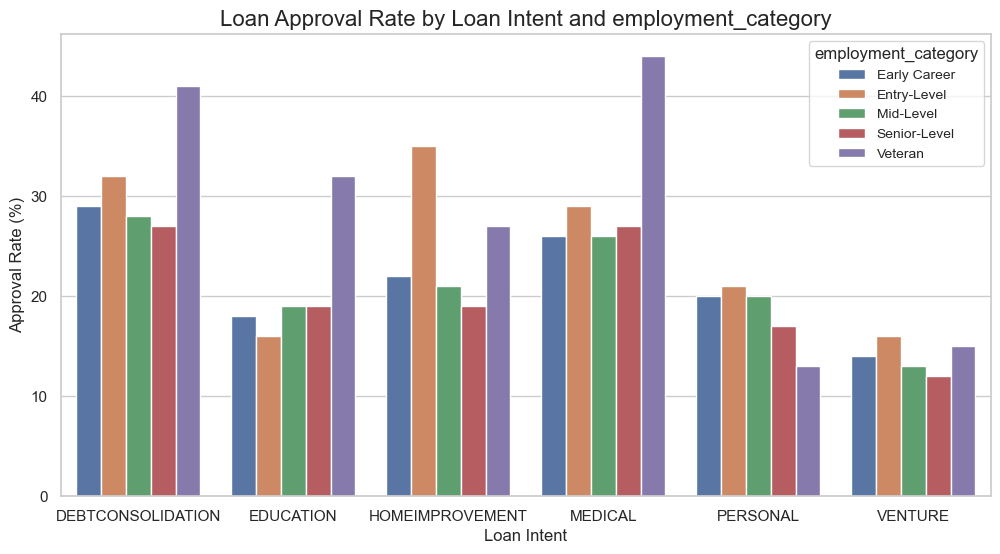

In [106]:
# Set the figure size
plt.figure(figsize=(12, 6))

# Create a clustered bar chart with seaborn
sns.barplot(x='loan_intent', y='Approval_Rate', hue='employment_category', data=approval_rates, ci=None)

# Add title and labels
plt.title('Loan Approval Rate by Loan Intent and employment_category', fontsize=16)
plt.xlabel('Loan Intent', fontsize=12)
plt.ylabel('Approval Rate (%)', fontsize=12)
plt.legend(title='employment_category', fontsize=10)

# Display the plot
plt.show()

## what are the Approval Rates for the loan_interest Rate Categories?

In [107]:
df["loan_int_rate"].describe()

count    44935.000000
mean        11.006128
std          2.978878
min          5.420000
25%          8.590000
50%         11.010000
75%         12.990000
max         20.000000
Name: loan_int_rate, dtype: float64

In [108]:
# Define categories
def categorize_loan_rate(rate):
    if rate < 8.59:
        return 'Low_Interest'
    elif 8.59 <= rate < 11.01:
        return 'Medium_Interest'
    elif 11.01 <= rate < 12.99:
        return 'High_Interest'
    else:
        return 'Very High_Interest'

# Apply categorization
df['loan_int_rate_category'] = df['loan_int_rate'].apply(categorize_loan_rate)

In [109]:
grouped = df.groupby(['loan_int_rate_category'])['loan_status']

# Calculate approval rate (assuming 'Yes' and 'No' in Loan_Status)
approval_rates = grouped.apply(lambda x: (x == 'Yes').mean() * 100).reset_index(name='Approval_Rate').round()
approval_rates['Approval_Rate'] = approval_rates['Approval_Rate']

In [110]:
approval_rates

,loan_int_rate_category,Approval_Rate
0,High_Interest,20.0
1,Low_Interest,9.0
2,Medium_Interest,15.0
3,Very High_Interest,43.0


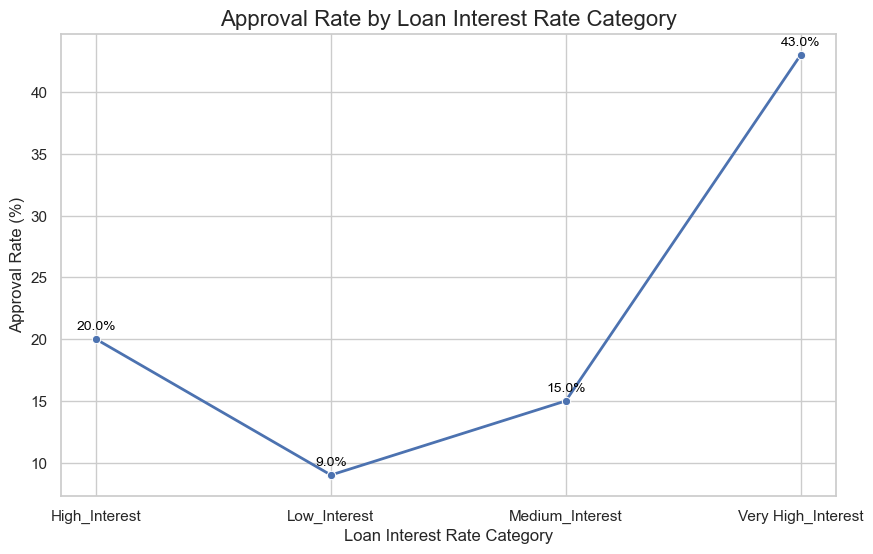

In [111]:
# Create the line chart
plt.figure(figsize=(10, 6))
sns.lineplot(data=approval_rates, x='loan_int_rate_category', y='Approval_Rate', marker='o', linewidth=2)

# Add data labels
for i, row in approval_rates.iterrows():
    plt.text(row['loan_int_rate_category'], row['Approval_Rate'] + 0.5, 
             f"{row['Approval_Rate']}%", 
             ha='center', va='bottom', fontsize=10, color='black')

# Title and labels
plt.title('Approval Rate by Loan Interest Rate Category', fontsize=16)
plt.xlabel('Loan Interest Rate Category', fontsize=12)
plt.ylabel('Approval Rate (%)', fontsize=12)

# Show the plot
plt.show()

## 25)what are the Approval rates for Loan_Interest and Education?

In [112]:
grouped = df.groupby(['loan_int_rate_category', 'person_education'])['loan_status']

# Calculate approval rate (assuming 'Yes' and 'No' in Loan_Status)
approval_rates = grouped.apply(lambda x: (x == 'Yes').mean() * 100).reset_index(name='Approval_Rate').round()
approval_rates['Approval_Rate'] = approval_rates['Approval_Rate']

In [113]:
approval_rates

,loan_int_rate_category,person_education,Approval_Rate
0,High_Interest,Associate,20.0
1,High_Interest,Bachelor,20.0
2,High_Interest,Doctorate,19.0
3,High_Interest,High School,20.0
4,High_Interest,Master,19.0
5,Low_Interest,Associate,10.0
6,Low_Interest,Bachelor,10.0
7,Low_Interest,Doctorate,8.0
8,Low_Interest,High School,9.0
9,Low_Interest,Master,9.0


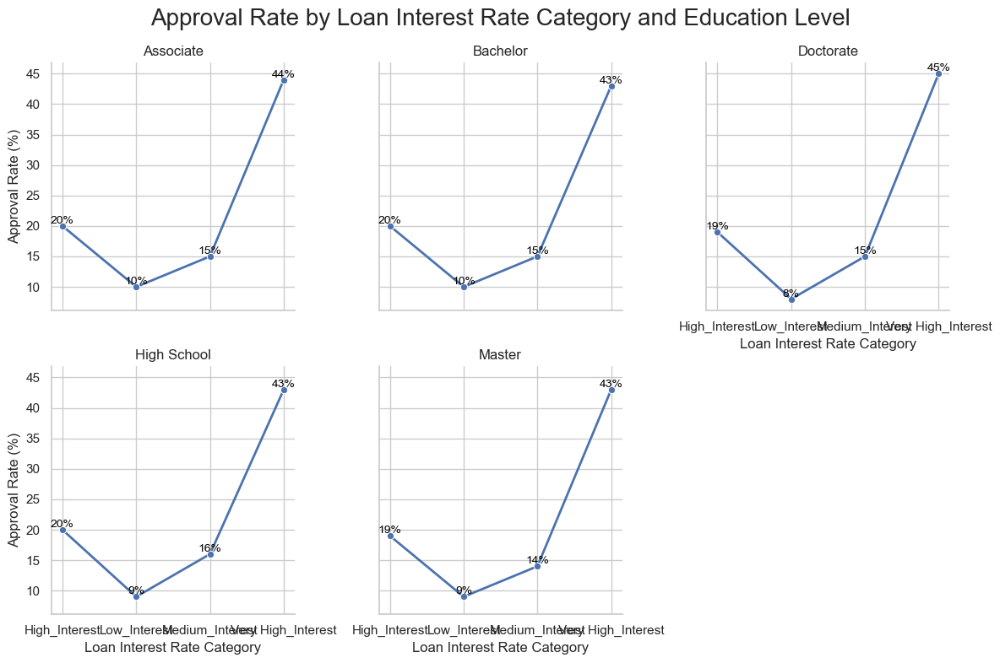

In [114]:
# Create the FacetGrid
g = sns.FacetGrid(approval_rates, col="person_education", col_wrap=3, height=4)
g.map(sns.lineplot, "loan_int_rate_category", "Approval_Rate", marker='o', linewidth=2)

# Add labels to each data point
for ax in g.axes.flat:
    data = ax.get_lines()[0].get_xydata()  # Extract x, y data from the line
    for (x, y) in data:
        ax.text(x, y, f'{y:.0f}%', color='black', fontsize=10, ha='center', va='bottom')

# Add titles and labels
g.fig.suptitle('Approval Rate by Loan Interest Rate Category and Education Level', fontsize=20)
g.set_axis_labels('Loan Interest Rate Category', 'Approval Rate (%)')
g.set_titles('{col_name}')

# Adjust layout to avoid overlap
g.tight_layout()
g.fig.subplots_adjust(top=0.9)

plt.show()

In [115]:
##26)

In [116]:
education_counts = df.groupby(['loan_int_rate_category', 'person_education'])['loan_int_rate_category'].count().reset_index(name='count')
education_counts

,loan_int_rate_category,person_education,count
0,High_Interest,Associate,3314
1,High_Interest,Bachelor,3646
2,High_Interest,Doctorate,157
3,High_Interest,High School,3251
4,High_Interest,Master,1977
5,Low_Interest,Associate,3005
6,Low_Interest,Bachelor,3315
7,Low_Interest,Doctorate,162
8,Low_Interest,High School,2937
9,Low_Interest,Master,1726


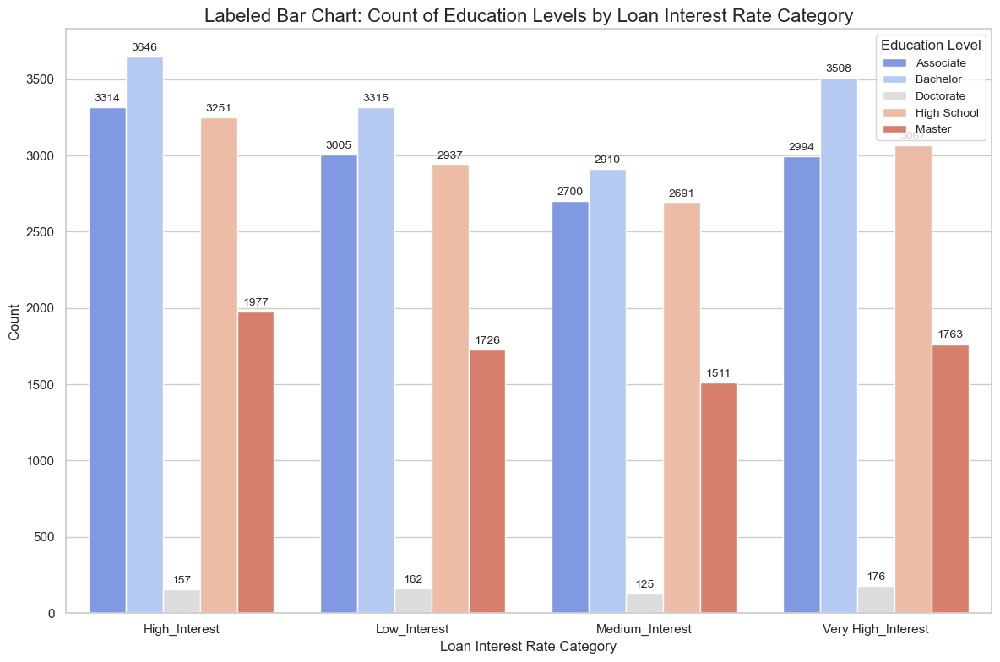

In [117]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set up the bar plot
plt.figure(figsize=(12, 8))
barplot = sns.barplot(data=education_counts, 
                      x='loan_int_rate_category', 
                      y='count', 
                      hue='person_education', 
                      palette='coolwarm')

# Add labels to each bar
for container in barplot.containers:
    barplot.bar_label(container, fmt='%.0f', label_type='edge', fontsize=10, padding=3)

# Title and labels
plt.title('Labeled Bar Chart: Count of Education Levels by Loan Interest Rate Category', fontsize=16)
plt.xlabel('Loan Interest Rate Category', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.legend(title='Education Level', fontsize=10)

plt.tight_layout()
plt.show()


In [118]:
## 27)

In [119]:
education_counts = df.groupby(['income_group', 'person_education'])['person_education'].count().reset_index(name='count')
education_counts

,income_group,person_education,count
0,High,Associate,334
1,High,Bachelor,356
2,High,Doctorate,22
3,High,High School,305
4,High,Master,198
5,Low,Associate,3518
6,Low,Bachelor,3863
7,Low,Doctorate,170
8,Low,High School,3474
9,Low,Master,2009


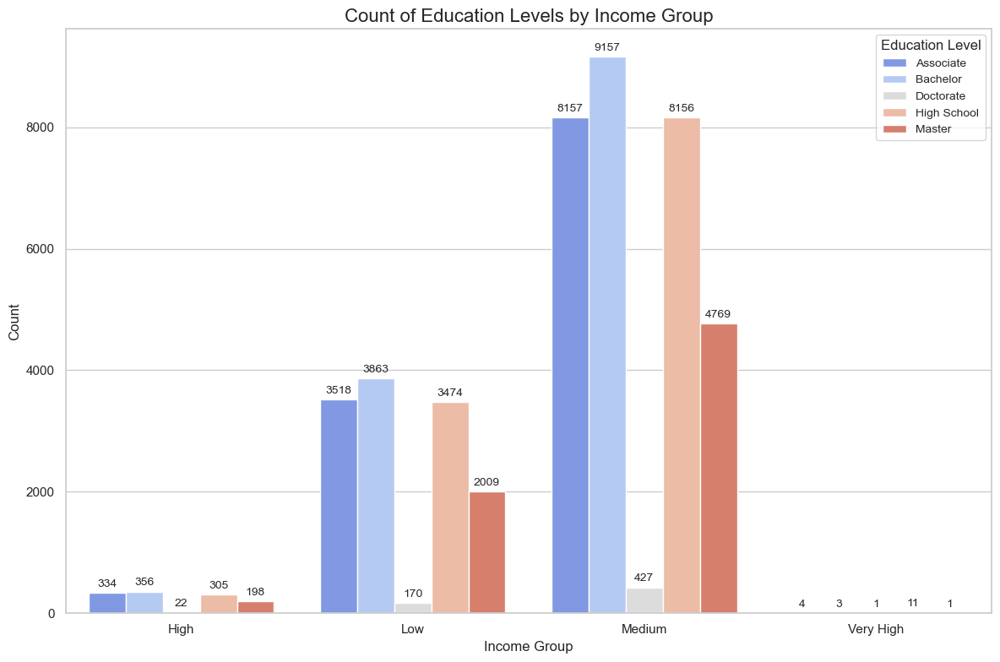

In [120]:
# Set up the bar plot
plt.figure(figsize=(12, 8))
barplot = sns.barplot(data=education_counts, 
                      x='income_group', 
                      y='count', 
                      hue='person_education', 
                      palette='coolwarm')

# Add labels to each bar
for container in barplot.containers:
    barplot.bar_label(container, fmt='%.0f', label_type='edge', fontsize=10, padding=3)

# Title and labels
plt.title('Count of Education Levels by Income Group', fontsize=16)
plt.xlabel('Income Group', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.legend(title='Education Level', fontsize=10)

plt.tight_layout()
plt.show()


## 28) Is there any Relationship between Debet Repayment Debet and Annual_Income? 
## or Is Higher income Generally leads to higher Debet Repayment or not?

In [121]:
# Create 'monthly_income' column
df['monthly_income'] = (df['person_income'] / 12).round()

In [122]:
# Calculate debt repayment capacity
df['debt_repayment_capacity'] = df['person_income'] - (df['loan_amnt'] * df['loan_int_rate'] / 100)

In [123]:
df['debt_repayment_capacity'].describe()

count    4.493500e+04
mean     7.877138e+04
std      6.234791e+04
min      7.533875e+03
25%      4.637463e+04
50%      6.611865e+04
75%      9.422748e+04
max      2.447622e+06
Name: debt_repayment_capacity, dtype: float64

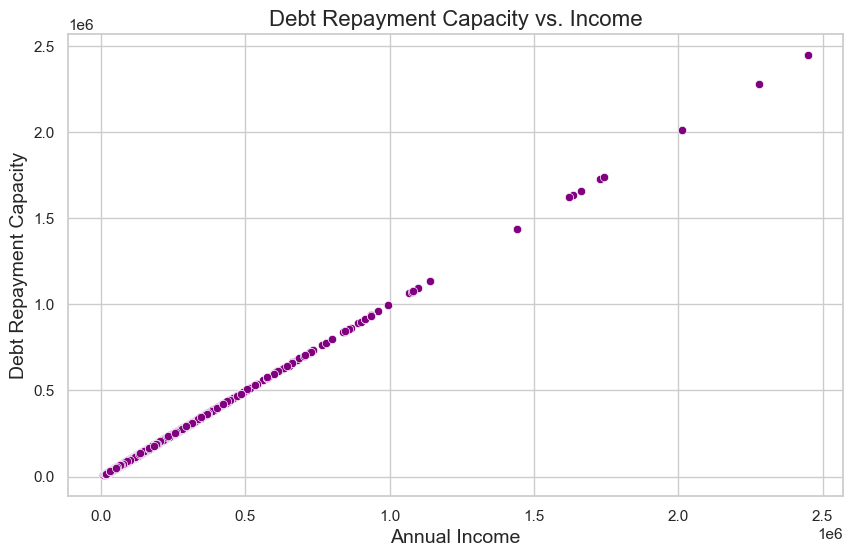

In [124]:
# Scatter plot of Debt Repayment Capacity vs. Income
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df['person_income'], y=df['debt_repayment_capacity'], color='purple')
plt.title('Debt Repayment Capacity vs. Income', fontsize=16)
plt.xlabel('Annual Income', fontsize=14)
plt.ylabel('Debt Repayment Capacity', fontsize=14)
plt.show()


## 29)Is There any relationship between loan_amount and Dept Repayment ?

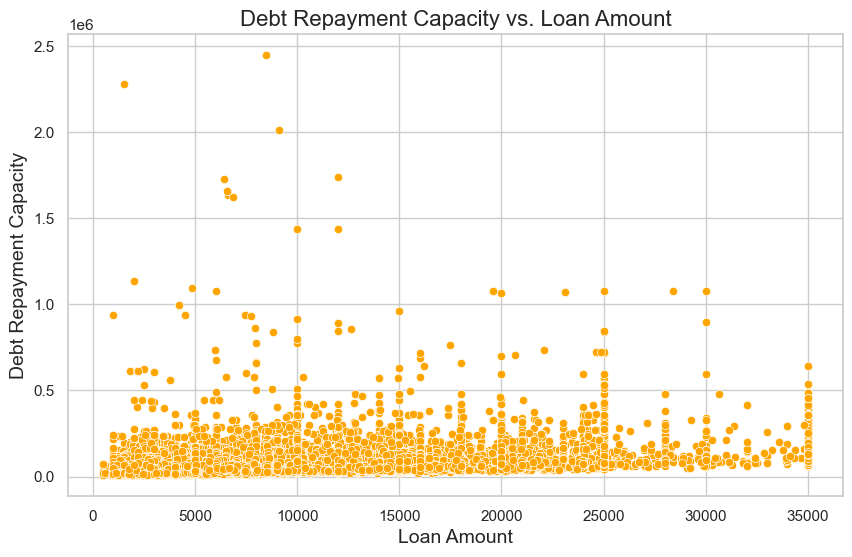

In [125]:
# Scatter plot of Debt Repayment Capacity vs. Loan Amount
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df['loan_amnt'], y=df['debt_repayment_capacity'], color='orange')
plt.title('Debt Repayment Capacity vs. Loan Amount', fontsize=16)
plt.xlabel('Loan Amount', fontsize=14)
plt.ylabel('Debt Repayment Capacity', fontsize=14)
plt.show()

## 30)Is There any relationship between loan_Interest_Rate and Dept Repayment ?

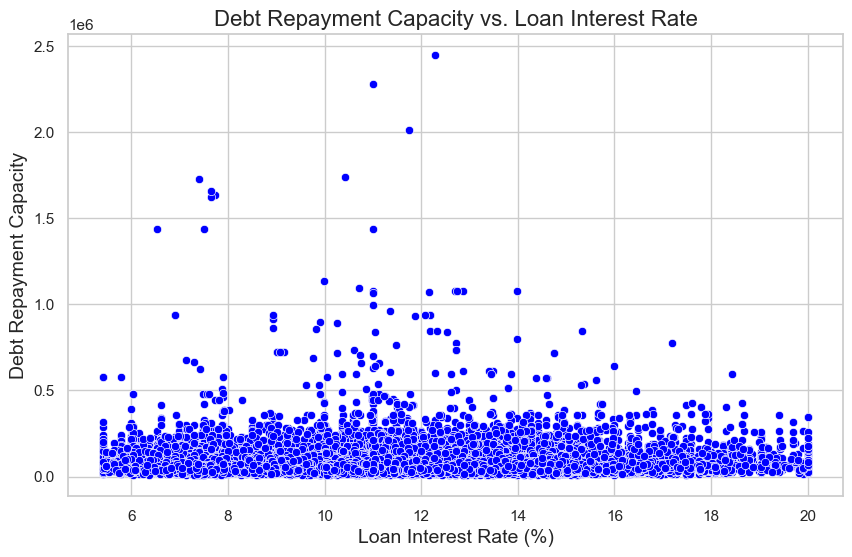

In [126]:
# Scatter plot of Debt Repayment Capacity vs. Interest Rate
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df['loan_int_rate'], y=df['debt_repayment_capacity'], color='blue')
plt.title('Debt Repayment Capacity vs. Loan Interest Rate', fontsize=16)
plt.xlabel('Loan Interest Rate (%)', fontsize=14)
plt.ylabel('Debt Repayment Capacity', fontsize=14)
plt.show()

## What are the Approval Rates over Person_Income Stability?

In [127]:
# income with experience
df['person_income_stability'] = df['person_income'] * df['person_emp_exp']
df['person_income_stability'].describe()

count    4.493500e+04
mean     4.751726e+05
std      1.087127e+06
min      0.000000e+00
25%      5.501200e+04
50%      2.374320e+05
75%      5.805705e+05
max      8.439626e+07
Name: person_income_stability, dtype: float64

In [128]:
# Function to categorize income stability
def categorize_income_stability(income_stability):
    if income_stability <= 55012:
        return 'Low Stability'
    elif income_stability <= 237432:
        return 'Medium-Low Stability'
    elif income_stability <= 580570:
        return 'Medium-High Stability'
    else:
        return 'High Stability'

# Apply the function to the 'person_income_stability' column
df['income_stability_category'] = df['person_income_stability'].apply(categorize_income_stability)

In [129]:
grouped = df.groupby(['income_stability_category'])['loan_status']

# Calculate approval rate (assuming 'Yes' and 'No' in Loan_Status)
approval_rates = grouped.apply(lambda x: (x == 'Yes').mean() * 100).reset_index(name='Approval_Rate').round()
approval_rates['Approval_Rate'] = approval_rates['Approval_Rate']

In [130]:
approval_rates

,income_stability_category,Approval_Rate
0,High Stability,15.0
1,Low Stability,27.0
2,Medium-High Stability,21.0
3,Medium-Low Stability,27.0


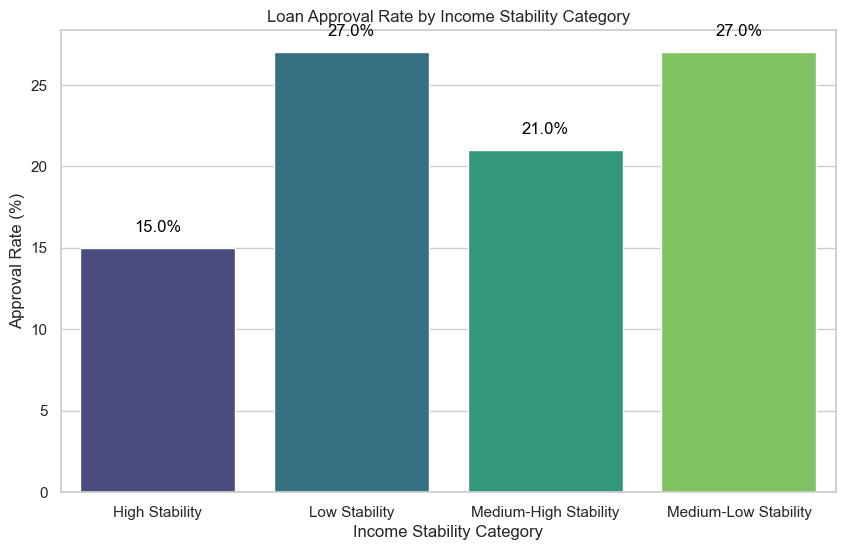

In [131]:
plt.figure(figsize=(10, 6))
sns.barplot(x='income_stability_category', y='Approval_Rate', data=approval_rates, palette='viridis')

# Adding labels and title
plt.title('Loan Approval Rate by Income Stability Category')
plt.xlabel('Income Stability Category')
plt.ylabel('Approval Rate (%)')
# Adding the value labels on top of the bars
for index, row in approval_rates.iterrows():
    plt.text(index, row['Approval_Rate'] + 1, f"{row['Approval_Rate']}%", 
             horizontalalignment='center', size=12, color='black')

# Display the plot
plt.show()

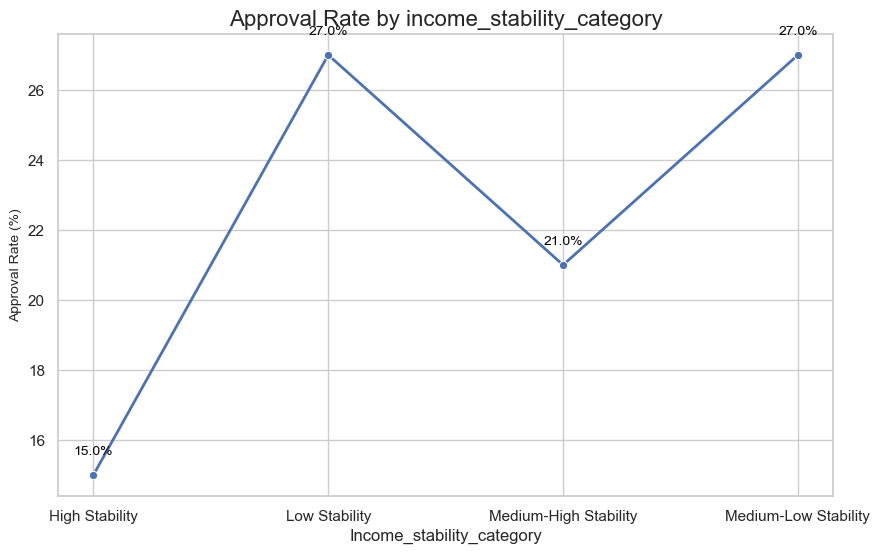

In [132]:
# Create the line chart
plt.figure(figsize=(10, 6))
sns.lineplot(data=approval_rates, x='income_stability_category', y='Approval_Rate', marker='o', linewidth=2)

# Add data labels
for i, row in approval_rates.iterrows():
    plt.text(row['income_stability_category'], row['Approval_Rate'] + 0.5, 
             f"{row['Approval_Rate']}%", 
             ha='center', va='bottom', fontsize=10, color='black')

# Title and labels
plt.title('Approval Rate by income_stability_category', fontsize=16)
plt.xlabel('Income_stability_category', fontsize=12)
plt.ylabel('Approval Rate (%)', fontsize=10)

# Show the plot
plt.show()

## what are the Approval Rates for Income history Category?

In [133]:
# income credit history
df['person_income_credit_history'] = (df['person_income'] / df['cb_person_cred_hist_length'])
df['person_income_credit_history'].describe()

count     44935.000000
mean      18542.403622
std       15270.959949
min         285.714286
25%        8233.145833
50%       14470.250000
75%       24221.000000
max      255560.500000
Name: person_income_credit_history, dtype: float64

In [134]:
def categorize_income_credit_history(income_credit_history):
    if income_credit_history <= 8233.15:
        return 'Low_income_credit'
    elif income_credit_history <= 24221.00:
        return 'Medium_income_credit'
    else:
        return 'High_income_credit'

# Apply the function to the 'person_income_credit_history' column
df['income_credit_history_category'] = df['person_income_credit_history'].apply(categorize_income_credit_history)


In [135]:
grouped = df.groupby(['income_credit_history_category'])['loan_status']

# Calculate approval rate (assuming 'Yes' and 'No' in Loan_Status)
approval_rates = grouped.apply(lambda x: (x == 'Yes').mean() * 100).reset_index(name='Approval_Rate').round()
approval_rates['Approval_Rate'] = approval_rates['Approval_Rate']

In [136]:
approval_rates

,income_credit_history_category,Approval_Rate
0,High_income_credit,13.0
1,Low_income_credit,33.0
2,Medium_income_credit,22.0


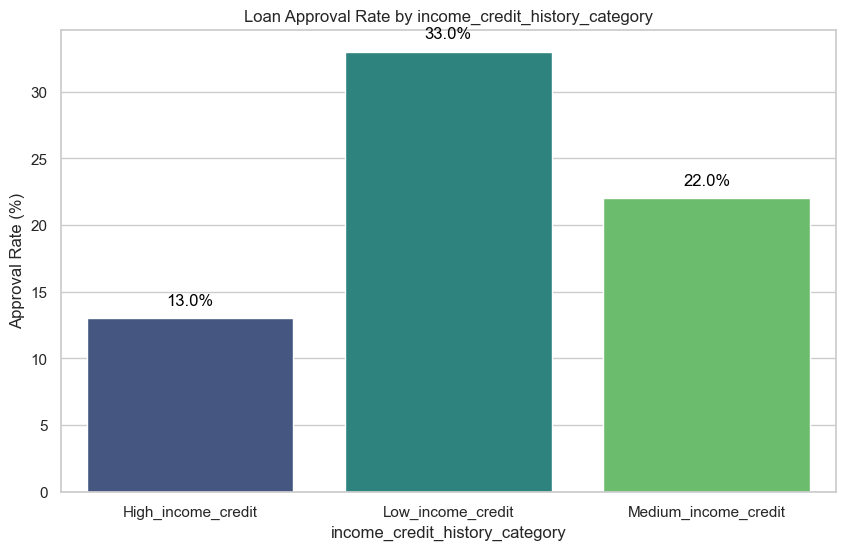

In [137]:
plt.figure(figsize=(10, 6))
sns.barplot(x='income_credit_history_category', y='Approval_Rate', data=approval_rates, palette='viridis')

# Adding labels and title
plt.title('Loan Approval Rate by income_credit_history_category')
plt.xlabel('income_credit_history_category')
plt.ylabel('Approval Rate (%)')
# Adding the value labels on top of the bars
for index, row in approval_rates.iterrows():
    plt.text(index, row['Approval_Rate'] + 1, f"{row['Approval_Rate']}%", 
             horizontalalignment='center', size=12, color='black')

# Display the plot
plt.show()

## show me the relation between Income categories and Income credit history categories?

In [138]:
grouped = df.groupby(['income_credit_history_category', 'income_group', 'loan_status']).size().reset_index(name='count')


In [139]:
grouped

,income_credit_history_category,income_group,loan_status,count
0,High_income_credit,High,No,876
1,High_income_credit,High,Yes,101
2,High_income_credit,Low,No,180
3,High_income_credit,Low,Yes,20
4,High_income_credit,Medium,No,8721
5,High_income_credit,Medium,Yes,1314
6,High_income_credit,Very High,No,20
7,Low_income_credit,High,No,2
8,Low_income_credit,Low,No,3765
9,Low_income_credit,Low,Yes,2747


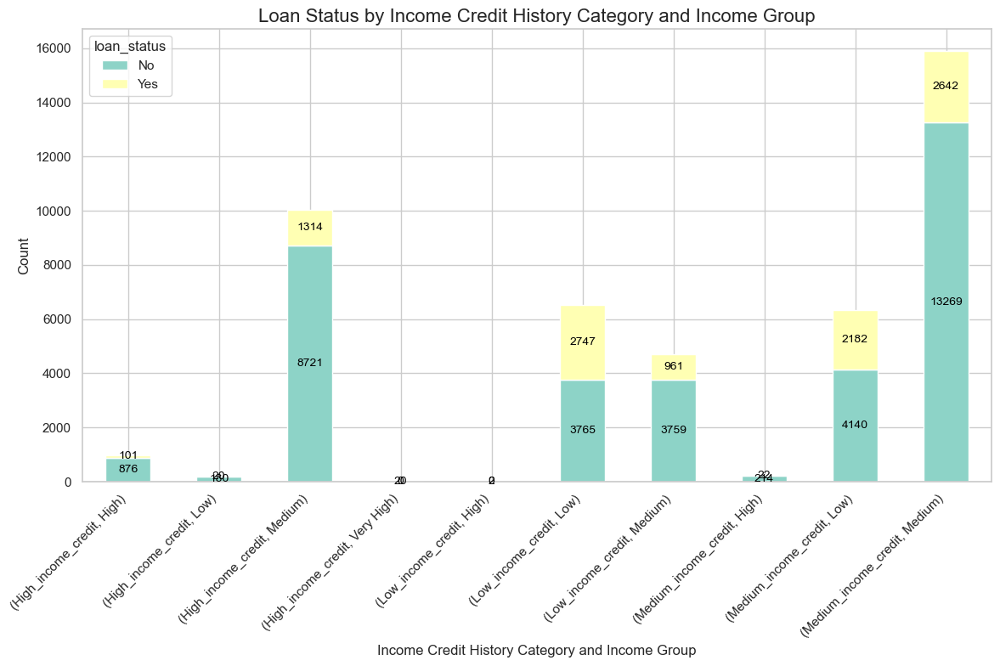

In [140]:
# Create a pivot table for easier plotting
pivoted = grouped.pivot_table(index=['income_credit_history_category', 'income_group'],
                              columns='loan_status', 
                              values='count', 
                              aggfunc='sum', 
                              fill_value=0)

# Plot using Seaborn's stacked bar plot
ax = pivoted.plot(kind='bar', stacked=True, color=sns.color_palette('Set3', n_colors=len(pivoted.columns)), figsize=(12, 8))

# Title and labels
plt.title('Loan Status by Income Credit History Category and Income Group', fontsize=16)
plt.xlabel('Income Credit History Category and Income Group', fontsize=12)
plt.ylabel('Count', fontsize=12)

# Rotate x labels for better visibility
plt.xticks(rotation=45, ha='right')

# Add labels to each section of the bars
for p in ax.patches:
    height = p.get_height()
    width = p.get_width()
    x, y = p.get_xy()  # Get the position of the bar
    ax.annotate(f'{int(height)}', (x + width / 2, y + height / 2), 
                horizontalalignment='center', verticalalignment='center',
                fontsize=10, color='black')

# Show the plot
plt.tight_layout()
plt.show()

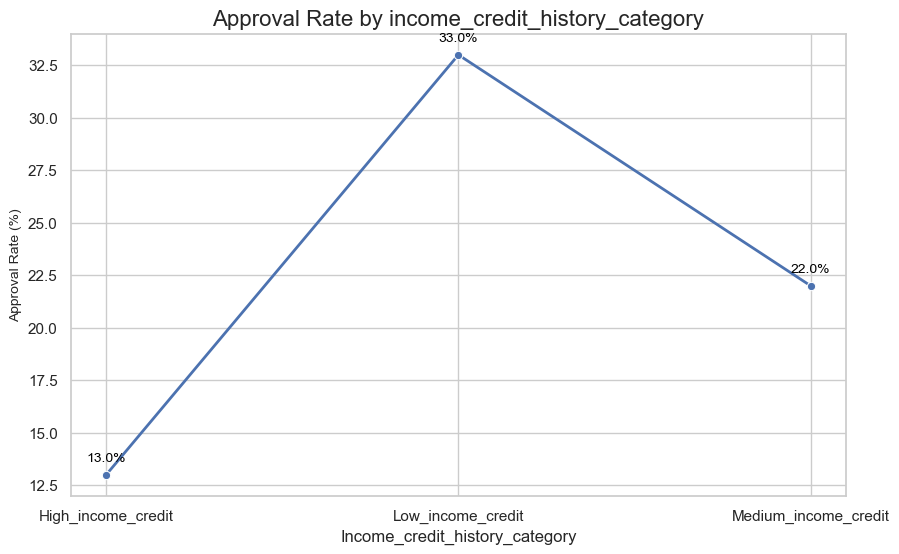

In [141]:
# Create the line chart
plt.figure(figsize=(10, 6))
sns.lineplot(data=approval_rates, x='income_credit_history_category', y='Approval_Rate', marker='o', linewidth=2)

# Add data labels
for i, row in approval_rates.iterrows():
    plt.text(row['income_credit_history_category'], row['Approval_Rate'] + 0.5, 
             f"{row['Approval_Rate']}%", 
             ha='center', va='bottom', fontsize=10, color='black')

# Title and labels
plt.title('Approval Rate by income_credit_history_category', fontsize=16)
plt.xlabel('Income_credit_history_category', fontsize=12)
plt.ylabel('Approval Rate (%)', fontsize=10)

# Show the plot
plt.show()

## what is the Count of Loan_Status by Gender?

In [142]:
# Group by both person_gender and loan_status, and count occurrences
grouped = df.groupby(['person_gender', 'loan_status']).size().reset_index(name='count')
grouped

,person_gender,loan_status,count
0,female,No,15665
1,female,Yes,4481
2,male,No,19281
3,male,Yes,5508


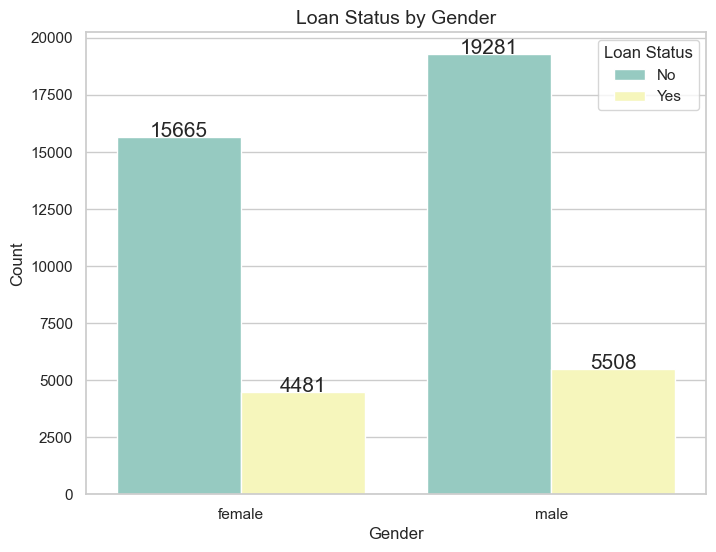

In [143]:
# Group by both person_gender and loan_status, and count occurrences
grouped = df.groupby(['person_gender', 'loan_status']).size().reset_index(name='count')

# Create the bar plot
plt.figure(figsize=(8, 6))
barplot = sns.barplot(data=grouped, x='person_gender', y='count', hue='loan_status', palette='Set3')

# Add labels only to visible bars in the main plot
for bar in barplot.patches:
    bar_x = bar.get_x() + bar.get_width() / 2  # Center the label horizontally
    bar_y = bar.get_height()  # Get the height of the bar
    if bar_y > 0:  # Only label bars with height > 0
        plt.text(bar_x, bar_y + 0.5, f'{int(bar_y)}', ha='center', fontsize=15)

# Add labels, title, and legend
plt.xlabel('Gender', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Loan Status by Gender', fontsize=14)
plt.legend(title='Loan Status', loc='upper right')

# Display the plot
plt.show()


## what is the Count of Loan_Status by Group_Age?

In [144]:
# Group by both person_gender and loan_status, and count occurrences
grouped = df.groupby(['grouped_age', 'loan_status']).size().reset_index(name='count')
grouped

,grouped_age,loan_status,count
0,18-25,No,15659
1,18-25,Yes,4782
2,26-35,No,15795
3,26-35,Yes,4278
4,36-50,No,3301
5,36-50,Yes,857
6,51+,No,191
7,51+,Yes,72


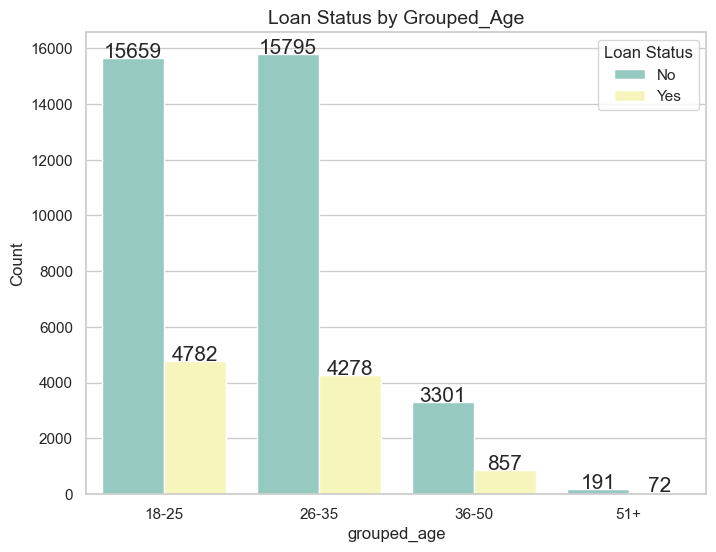

In [145]:
# Group by both person_gender and loan_status, and count occurrences
grouped = df.groupby(['grouped_age', 'loan_status']).size().reset_index(name='count')

# Create the bar plot
plt.figure(figsize=(8, 6))
barplot = sns.barplot(data=grouped, x='grouped_age', y='count', hue='loan_status', palette='Set3')

# Add labels only to visible bars in the main plot
for bar in barplot.patches:
    bar_x = bar.get_x() + bar.get_width() / 2  # Center the label horizontally
    bar_y = bar.get_height()  # Get the height of the bar
    if bar_y > 0:  # Only label bars with height > 0
        plt.text(bar_x, bar_y + 0.5, f'{int(bar_y)}', ha='center', fontsize=15)

# Add labels, title, and legend
plt.xlabel('grouped_age', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Loan Status by Grouped_Age', fontsize=14)
plt.legend(title='Loan Status', loc='upper right')

# Display the plot
plt.show()

## what is the Count of Loan_Status by Education_Levels?

In [146]:
Loan_Education = df.groupby(['person_education','loan_status']).size().unstack(fill_value=0).reset_index()
Loan_Education

loan_status,person_education,No,Yes
0,Associate,9365,2648
1,Bachelor,10364,3015
2,Doctorate,478,142
3,High School,9280,2666
4,Master,5459,1518


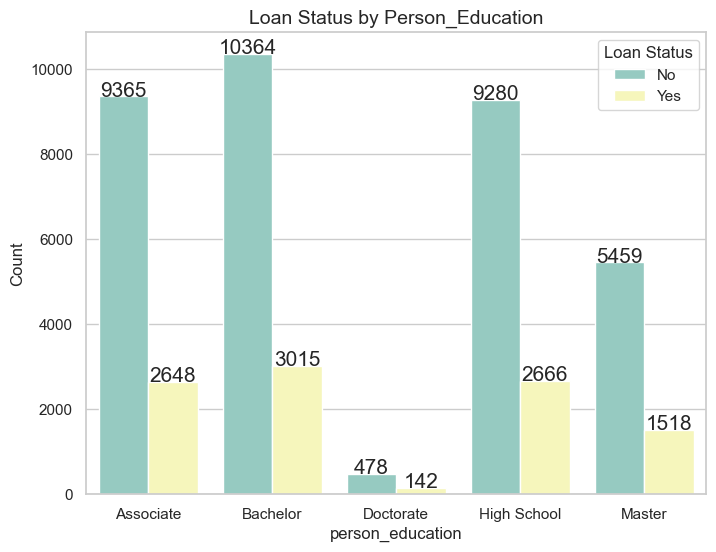

In [147]:
grouped = df.groupby(['person_education', 'loan_status']).size().reset_index(name='count')

# Create the bar plot
plt.figure(figsize=(8, 6))
barplot = sns.barplot(data=grouped, x='person_education', y='count', hue='loan_status', palette='Set3')

# Add labels only to visible bars in the main plot
for bar in barplot.patches:
    bar_x = bar.get_x() + bar.get_width() / 2  # Center the label horizontally
    bar_y = bar.get_height()  # Get the height of the bar
    if bar_y > 0:  # Only label bars with height > 0
        plt.text(bar_x, bar_y + 0.5, f'{int(bar_y)}', ha='center', fontsize=15)

# Add labels, title, and legend
plt.xlabel('person_education', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Loan Status by Person_Education', fontsize=14)
plt.legend(title='Loan Status', loc='upper right')

# Display the plot
plt.show()

## what is the Count of Loan_Status by Income_Group?

In [148]:
# Group by both person_gender and loan_status, and count occurrences
grouped = df.groupby(['income_group', 'loan_status']).size().reset_index(name='count')
grouped

,income_group,loan_status,count
0,High,No,1092
1,High,Yes,123
2,Low,No,8085
3,Low,Yes,4949
4,Medium,No,25749
5,Medium,Yes,4917
6,Very High,No,20


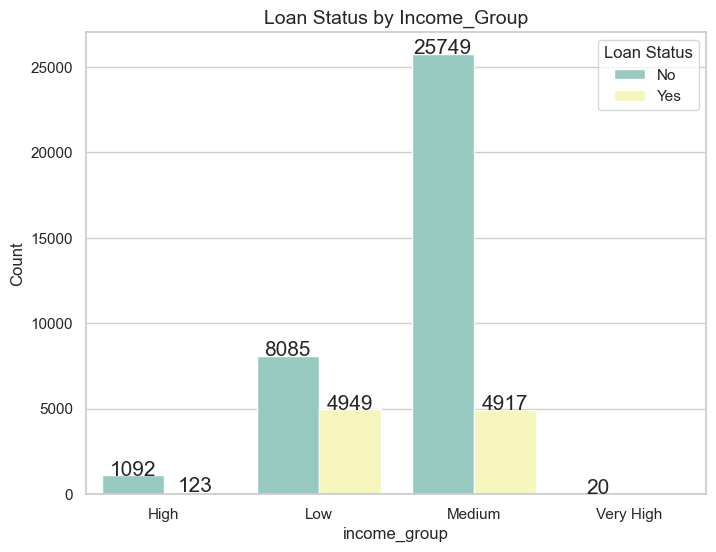

In [149]:
# Group by both person_gender and loan_status, and count occurrences
grouped = df.groupby(['income_group', 'loan_status']).size().reset_index(name='count')

# Create the bar plot
plt.figure(figsize=(8, 6))
barplot = sns.barplot(data=grouped, x='income_group', y='count', hue='loan_status', palette='Set3')

# Add labels only to visible bars in the main plot
for bar in barplot.patches:
    bar_x = bar.get_x() + bar.get_width() / 2  # Center the label horizontally
    bar_y = bar.get_height()  # Get the height of the bar
    if bar_y > 0:  # Only label bars with height > 0
        plt.text(bar_x, bar_y + 0.5, f'{int(bar_y)}', ha='center', fontsize=15)

# Add labels, title, and legend
plt.xlabel('income_group', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Loan Status by Income_Group', fontsize=14)
plt.legend(title='Loan Status', loc='upper right')

# Display the plot
plt.show()

## what is the Count of Loan_Status by Employment_Category?

In [150]:
# Group by both person_gender and loan_status, and count occurrences
grouped = df.groupby(['employment_category', 'loan_status']).size().reset_index(name='count')
grouped

,employment_category,loan_status,count
0,Early Career,No,8996
1,Early Career,Yes,2449
2,Entry-Level,No,16611
3,Entry-Level,Yes,5040
4,Mid-Level,No,7033
5,Mid-Level,Yes,1886
6,Senior-Level,No,1977
7,Senior-Level,Yes,498
8,Veteran,No,329
9,Veteran,Yes,116


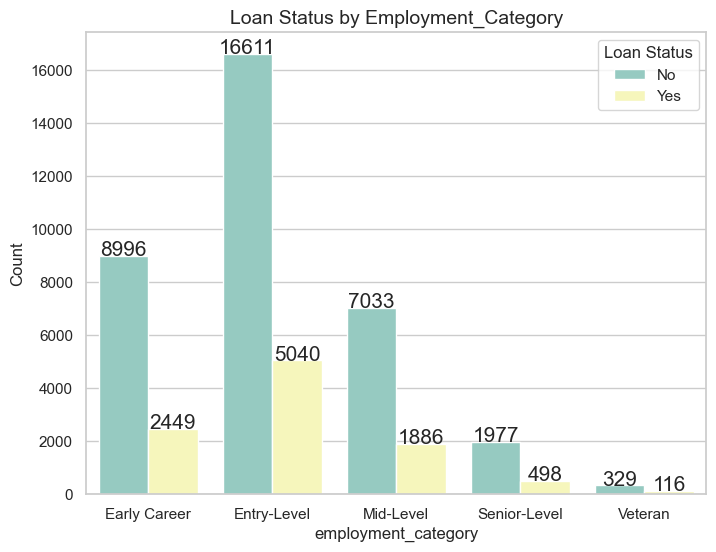

In [151]:
# Group by both person_gender and loan_status, and count occurrences
grouped = df.groupby(['employment_category', 'loan_status']).size().reset_index(name='count')

# Create the bar plot
plt.figure(figsize=(8, 6))
barplot = sns.barplot(data=grouped, x='employment_category', y='count', hue='loan_status', palette='Set3')

# Add labels only to visible bars in the main plot
for bar in barplot.patches:
    bar_x = bar.get_x() + bar.get_width() / 2  # Center the label horizontally
    bar_y = bar.get_height()  # Get the height of the bar
    if bar_y > 0:  # Only label bars with height > 0
        plt.text(bar_x, bar_y + 0.5, f'{int(bar_y)}', ha='center', fontsize=15)

# Add labels, title, and legend
plt.xlabel('employment_category', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Loan Status by Employment_Category', fontsize=14)
plt.legend(title='Loan Status', loc='upper right')

# Display the plot
plt.show()

## what is the count of Loan_status by Person_Home_Owenership?

In [152]:
grouped = df.groupby(['person_home_ownership', 'loan_status']).size().reset_index(name='count')
grouped

,person_home_ownership,loan_status,count
0,MORTGAGE,No,16356
1,MORTGAGE,Yes,2155
2,OWN,No,2735
3,OWN,Yes,225
4,RENT,No,15855
5,RENT,Yes,7609


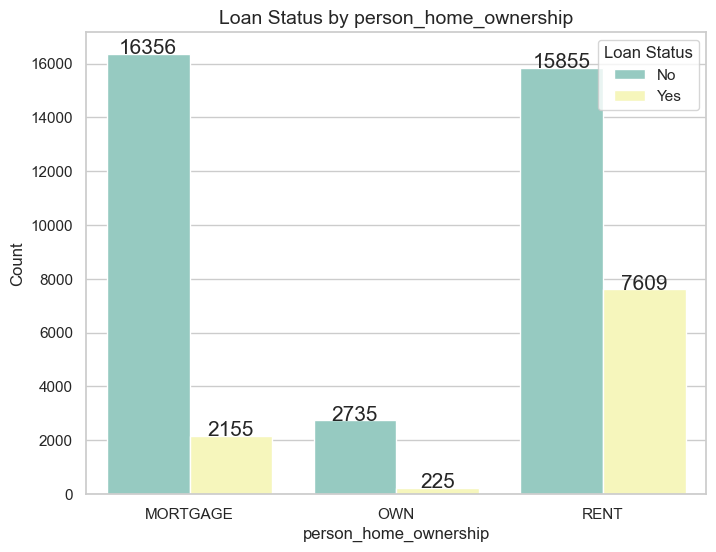

In [153]:
grouped = df.groupby(['person_home_ownership', 'loan_status']).size().reset_index(name='count')

# Create the bar plot
plt.figure(figsize=(8, 6))
barplot = sns.barplot(data=grouped, x='person_home_ownership', y='count', hue='loan_status', palette='Set3')

# Add labels only to visible bars in the main plot
for bar in barplot.patches:
    bar_x = bar.get_x() + bar.get_width() / 2  # Center the label horizontally
    bar_y = bar.get_height()  # Get the height of the bar
    if bar_y > 0:  # Only label bars with height > 0
        plt.text(bar_x, bar_y + 0.5, f'{int(bar_y)}', ha='center', fontsize=15)

# Add labels, title, and legend
plt.xlabel('person_home_ownership', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Loan Status by person_home_ownership', fontsize=14)
plt.legend(title='Loan Status', loc='upper right')

# Display the plot
plt.show()

## what is the Count of Loan_Status by loan_amnt_category?

In [154]:
# Group by both loan_amnt_category and loan_status, and count occurrences
grouped = df.groupby(['loan_amnt_category', 'loan_status']).size().reset_index(name='count')
grouped

,loan_amnt_category,loan_status,count
0,High_Loan,No,9957
1,High_Loan,Yes,2471
2,Low_Loan,No,8146
3,Low_Loan,Yes,2187
4,Medium_Loan,No,9029
5,Medium_Loan,Yes,1911
6,Very High_Loan,No,7814
7,Very High_Loan,Yes,3420


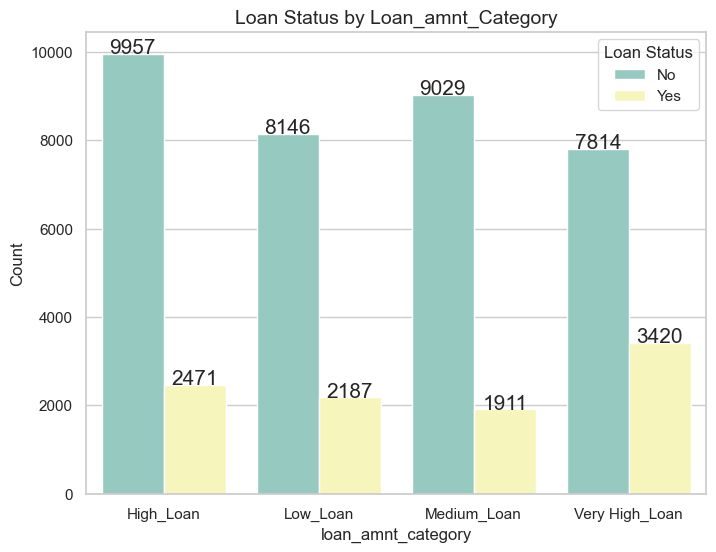

In [155]:
# Group by both person_loan_amnt_category and loan_status, and count occurrences
grouped = df.groupby(['loan_amnt_category', 'loan_status']).size().reset_index(name='count')

# Create the bar plot
plt.figure(figsize=(8, 6))
barplot = sns.barplot(data=grouped, x='loan_amnt_category', y='count', hue='loan_status', palette='Set3')

# Add labels only to visible bars in the main plot
for bar in barplot.patches:
    bar_x = bar.get_x() + bar.get_width() / 2  # Center the label horizontally
    bar_y = bar.get_height()  # Get the height of the bar
    if bar_y > 0:  # Only label bars with height > 0
        plt.text(bar_x, bar_y + 0.5, f'{int(bar_y)}', ha='center', fontsize=15)

# Add labels, title, and legend
plt.xlabel('loan_amnt_category', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Loan Status by Loan_amnt_Category', fontsize=14)
plt.legend(title='Loan Status', loc='upper right')

# Display the plot
plt.show()

## what is the Count of Loan_Status by loan_int_rate_category?

In [156]:
# Group by both loan_int_rate_category and loan_status, and count occurrences
grouped = df.groupby(['loan_int_rate_category', 'loan_status']).size().reset_index(name='count')
grouped

,loan_int_rate_category,loan_status,count
0,High_Interest,No,9884
1,High_Interest,Yes,2461
2,Low_Interest,No,10107
3,Low_Interest,Yes,1038
4,Medium_Interest,No,8431
5,Medium_Interest,Yes,1506
6,Very High_Interest,No,6524
7,Very High_Interest,Yes,4984


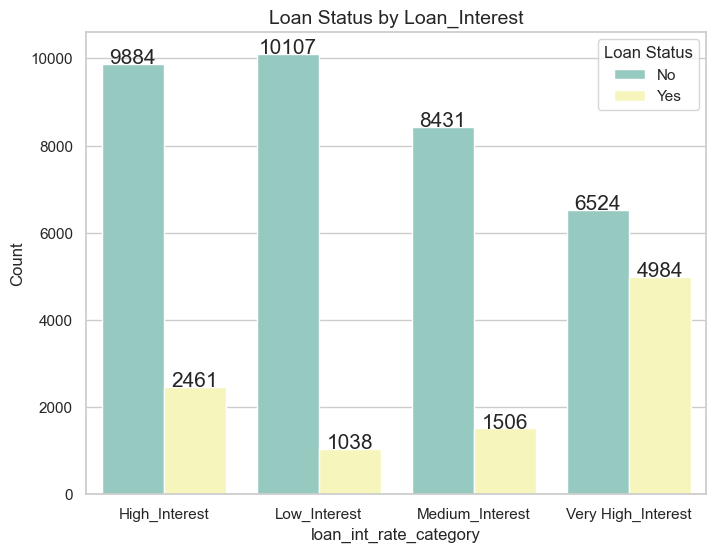

In [157]:
# Group by both person_loan_amnt_category and loan_status, and count occurrences
grouped = df.groupby(['loan_int_rate_category', 'loan_status']).size().reset_index(name='count')

# Create the bar plot
plt.figure(figsize=(8, 6))
barplot = sns.barplot(data=grouped, x='loan_int_rate_category', y='count', hue='loan_status', palette='Set3')

# Add labels only to visible bars in the main plot
for bar in barplot.patches:
    bar_x = bar.get_x() + bar.get_width() / 2  # Center the label horizontally
    bar_y = bar.get_height()  # Get the height of the bar
    if bar_y > 0:  # Only label bars with height > 0
        plt.text(bar_x, bar_y + 0.5, f'{int(bar_y)}', ha='center', fontsize=15)

# Add labels, title, and legend
plt.xlabel('loan_int_rate_category', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Loan Status by Loan_Interest', fontsize=14)
plt.legend(title='Loan Status', loc='upper right')

# Display the plot
plt.show()

## what is the Count of Loan_Status by Income Stability Category?

In [158]:
# Group by both loan_int_rate_category and loan_status, and count occurrences
grouped = df.groupby(['income_stability_category', 'loan_status']).size().reset_index(name='count')
grouped

,income_stability_category,loan_status,count
0,High Stability,No,9571
1,High Stability,Yes,1663
2,Low Stability,No,8255
3,Low Stability,Yes,2979
4,Medium-High Stability,No,8890
5,Medium-High Stability,Yes,2343
6,Medium-Low Stability,No,8230
7,Medium-Low Stability,Yes,3004


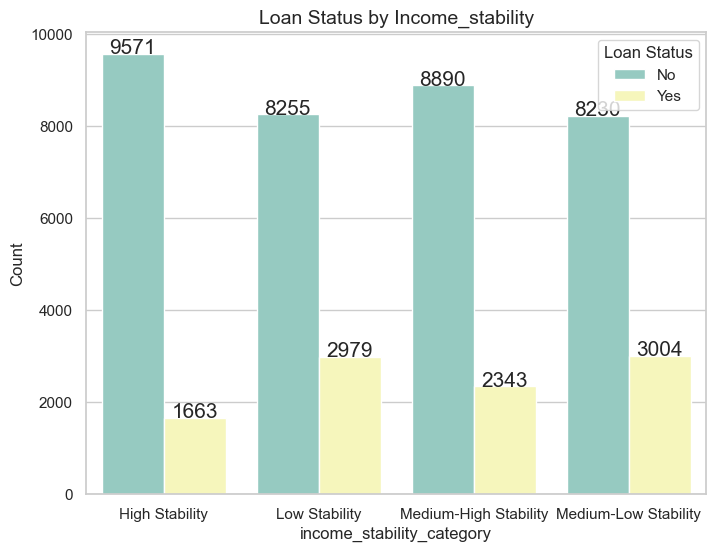

In [159]:
# Group by both person_loan_amnt_category and loan_status, and count occurrences
grouped = df.groupby(['income_stability_category', 'loan_status']).size().reset_index(name='count')

# Create the bar plot
plt.figure(figsize=(8, 6))
barplot = sns.barplot(data=grouped, x='income_stability_category', y='count', hue='loan_status', palette='Set3')

# Add labels only to visible bars in the main plot
for bar in barplot.patches:
    bar_x = bar.get_x() + bar.get_width() / 2  # Center the label horizontally
    bar_y = bar.get_height()  # Get the height of the bar
    if bar_y > 0:  # Only label bars with height > 0
        plt.text(bar_x, bar_y + 0.5, f'{int(bar_y)}', ha='center', fontsize=15)

# Add labels, title, and legend
plt.xlabel('income_stability_category', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Loan Status by Income_stability', fontsize=14)
plt.legend(title='Loan Status', loc='upper right')

# Display the plot
plt.show()

## what is the count of Loan_Status by Income credit history category?

In [160]:
grouped = df.groupby(['income_credit_history_category', 'loan_status']).size().reset_index(name='count')
grouped

,income_credit_history_category,loan_status,count
0,High_income_credit,No,9797
1,High_income_credit,Yes,1435
2,Low_income_credit,No,7526
3,Low_income_credit,Yes,3708
4,Medium_income_credit,No,17623
5,Medium_income_credit,Yes,4846


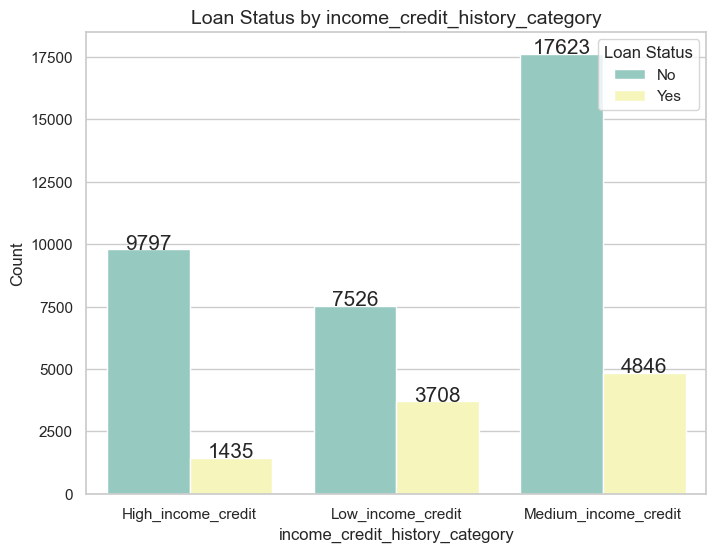

In [161]:
# Group by both person_loan_amnt_category and loan_status, and count occurrences
grouped = df.groupby(['income_credit_history_category', 'loan_status']).size().reset_index(name='count')

# Create the bar plot
plt.figure(figsize=(8, 6))
barplot = sns.barplot(data=grouped, x='income_credit_history_category', y='count', hue='loan_status', palette='Set3')

# Add labels only to visible bars in the main plot
for bar in barplot.patches:
    bar_x = bar.get_x() + bar.get_width() / 2  # Center the label horizontally
    bar_y = bar.get_height()  # Get the height of the bar
    if bar_y > 0:  # Only label bars with height > 0
        plt.text(bar_x, bar_y + 0.5, f'{int(bar_y)}', ha='center', fontsize=15)

# Add labels, title, and legend
plt.xlabel('income_credit_history_category', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Loan Status by income_credit_history_category', fontsize=14)
plt.legend(title='Loan Status', loc='upper right')

# Display the plot
plt.show()

## what the count of loan_status by Monthly Income?

In [162]:
df["monthly_income"].describe()

count     44935.000000
mean       6654.443819
std        5214.989501
min         667.000000
25%        3931.000000
50%        5587.000000
75%        7980.000000
max      204055.000000
Name: monthly_income, dtype: float64

In [163]:
def categorize_monthly_income(monthly_income):
     if monthly_income <= 7980:
        return 'Low_Monthly_income'
     elif monthly_income <= 20405.5:
        return 'Medium_Monthly_income'
     else:
        return 'High_Monthly_income'

# Apply the function to the 'monthly_income' column
df['monthly_income_category'] = df['monthly_income'].apply(categorize_monthly_income)

In [164]:
grouped = df.groupby(['monthly_income_category', 'loan_status']).size().reset_index(name='count')
grouped

,monthly_income_category,loan_status,count
0,High_Monthly_income,No,516
1,High_Monthly_income,Yes,73
2,Low_Monthly_income,No,24757
3,Low_Monthly_income,Yes,8947
4,Medium_Monthly_income,No,9673
5,Medium_Monthly_income,Yes,969


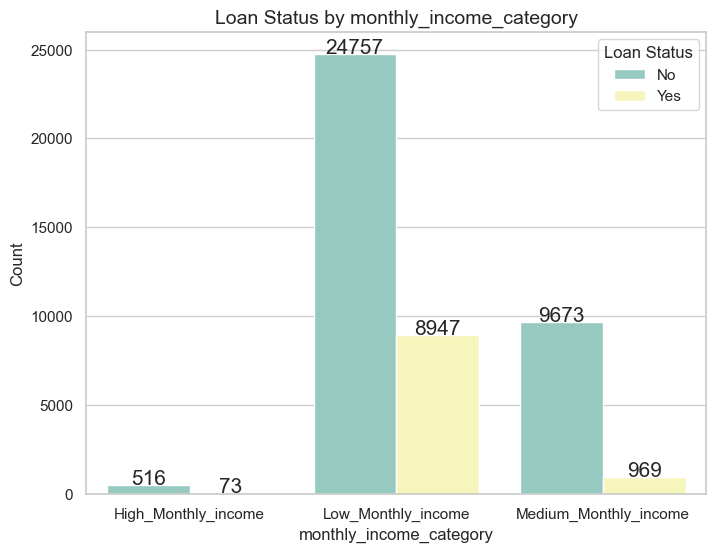

In [165]:
grouped = df.groupby(['monthly_income_category', 'loan_status']).size().reset_index(name='count')

# Create the bar plot
plt.figure(figsize=(8, 6))
barplot = sns.barplot(data=grouped, x='monthly_income_category', y='count', hue='loan_status', palette='Set3')

# Add labels only to visible bars in the main plot
for bar in barplot.patches:
    bar_x = bar.get_x() + bar.get_width() / 2  # Center the label horizontally
    bar_y = bar.get_height()  # Get the height of the bar
    if bar_y > 0:  # Only label bars with height > 0
        plt.text(bar_x, bar_y + 0.5, f'{int(bar_y)}', ha='center', fontsize=15)

# Add labels, title, and legend
plt.xlabel('monthly_income_category', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Loan Status by monthly_income_category', fontsize=14)
plt.legend(title='Loan Status', loc='upper right')

# Display the plot
plt.show()

In [166]:
grouped = df.groupby(['monthly_income_category'])['loan_status']
# Calculate approval rate (assuming 'Yes' and 'No' in Loan_Status)
approval_rates = grouped.apply(lambda x: (x == 'Yes').mean() * 100).reset_index(name='Approval_Rate').round()
approval_rates['Approval_Rate'] = approval_rates['Approval_Rate']

In [167]:
approval_rates

,monthly_income_category,Approval_Rate
0,High_Monthly_income,12.0
1,Low_Monthly_income,27.0
2,Medium_Monthly_income,9.0


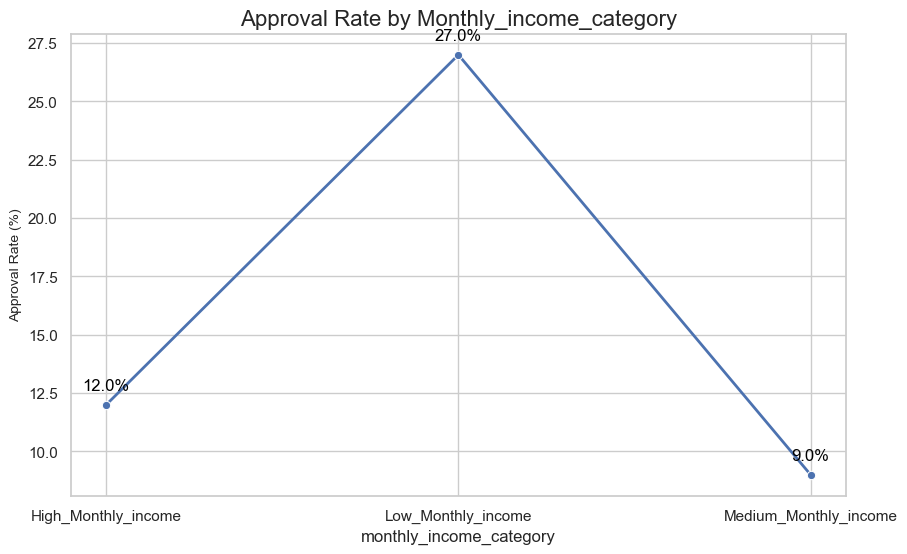

In [168]:
# Create the line chart
plt.figure(figsize=(10, 6))
sns.lineplot(data=approval_rates, x='monthly_income_category', y='Approval_Rate', marker='o', linewidth=2)

# Add data labels
for i, row in approval_rates.iterrows():
    plt.text(row['monthly_income_category'], row['Approval_Rate'] + 0.5, 
             f"{row['Approval_Rate']}%", 
             ha='center', va='bottom', fontsize=12, color='black')

# Title and labels
plt.title('Approval Rate by Monthly_income_category', fontsize=16)
plt.xlabel('monthly_income_category', fontsize=12)
plt.ylabel('Approval Rate (%)', fontsize=10)

# Show the plot
plt.show()

## What is the count of Loan_Status by Loan_intent?

In [169]:
grouped = df.groupby(['loan_intent', 'loan_status']).size().reset_index(name='count')
grouped

,loan_intent,loan_status,count
0,DEBTCONSOLIDATION,No,4982
1,DEBTCONSOLIDATION,Yes,2158
2,EDUCATION,No,7594
3,EDUCATION,Yes,1550
4,HOMEIMPROVEMENT,No,3523
5,HOMEIMPROVEMENT,Yes,1257
6,MEDICAL,No,6150
7,MEDICAL,Yes,2375
8,PERSONAL,No,6011
9,PERSONAL,Yes,1521


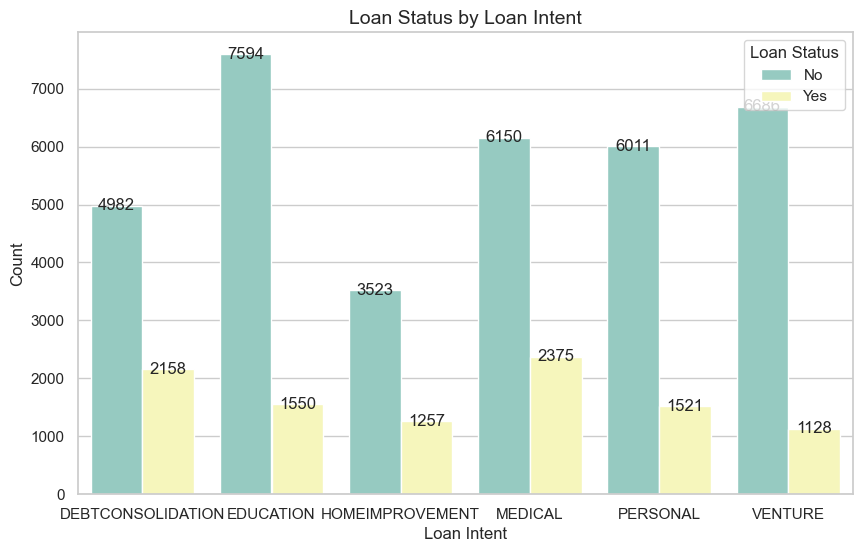

In [170]:
# Sample grouped data
grouped = df.groupby(['loan_intent', 'loan_status']).size().reset_index(name='count')

# Create the bar plot
plt.figure(figsize=(10, 6))  # Adjust figure size
barplot = sns.barplot(data=grouped, x='loan_intent', y='count', hue='loan_status', palette='Set3')

# Add labels on top of each bar
for bar in barplot.patches:
    bar_x = bar.get_x() + bar.get_width() / 2  # Center horizontally
    bar_height = bar.get_height()  # Height of the bar
    if bar_height > 0:  # Avoid labeling bars with no height
        plt.text(
            bar.get_x() + bar.get_width() / 2,  # X position
            bar_height + 0.5,  # Y position (slightly above the bar)
            f'{int(bar_height)}',  # Text label
            ha='center',
            va='center',
            fontsize=12
        )

# Add labels, title, and legend
plt.xlabel('Loan Intent', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Loan Status by Loan Intent', fontsize=14)
plt.legend(title='Loan Status', loc='upper right')

# Display the plot
plt.show()

## what is the count of loan_status by loan_Percentile_Income?

In [171]:
def categorize_loan_percent_income(loan_percent_income):
    if loan_percent_income <= 0.07:  # 7%
        return 'Low_Percentile'
    elif loan_percent_income <= 0.19:  # 19%
        return 'Medium_Percentile'
    else:
        return 'High_Percentile'

df['loan_percent_income_category'] = df['loan_percent_income'].apply(categorize_loan_percent_income)

In [172]:
grouped = df.groupby(['loan_percent_income_category', 'loan_status']).size().reset_index(name='count')
grouped

,loan_percent_income_category,loan_status,count
0,High_Percentile,No,5373
1,High_Percentile,Yes,5016
2,Low_Percentile,No,10247
3,Low_Percentile,Yes,1295
4,Medium_Percentile,No,19326
5,Medium_Percentile,Yes,3678


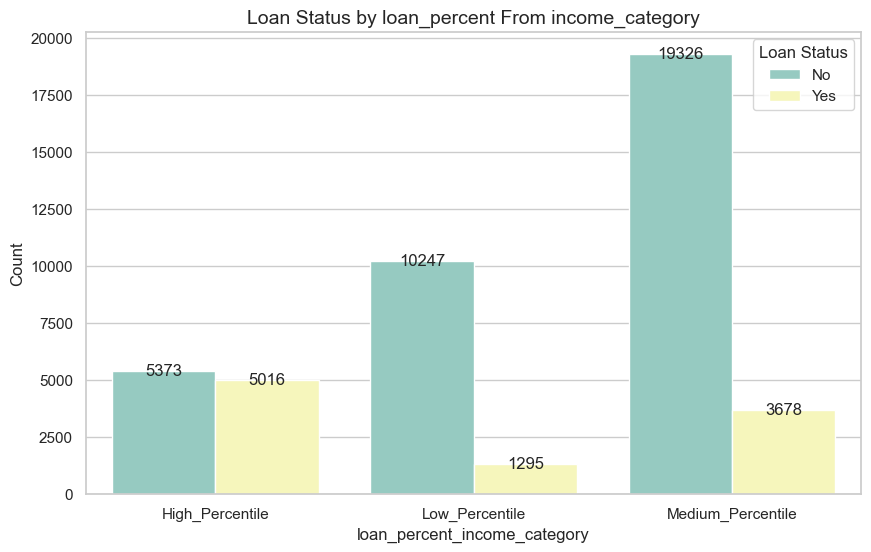

In [173]:
# Sample grouped data
grouped = df.groupby(['loan_percent_income_category', 'loan_status']).size().reset_index(name='count')

# Create the bar plot
plt.figure(figsize=(10, 6))  # Adjust figure size
barplot = sns.barplot(data=grouped, x='loan_percent_income_category', y='count', hue='loan_status', palette='Set3')

# Add labels on top of each bar
for bar in barplot.patches:
    bar_x = bar.get_x() + bar.get_width() / 2  # Center horizontally
    bar_height = bar.get_height()  # Height of the bar
    if bar_height > 0:  # Avoid labeling bars with no height
        plt.text(
            bar.get_x() + bar.get_width() / 2,  # X position
            bar_height + 0.5,  # Y position (slightly above the bar)
            f'{int(bar_height)}',  # Text label
            ha='center',
            va='center',
            fontsize=12
        )

# Add labels, title, and legend
plt.xlabel('loan_percent_income_category', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Loan Status by loan_percent From income_category', fontsize=14)
plt.legend(title='Loan Status', loc='upper right')

# Display the plot
plt.show()

## what are the Approval rates for Loan_Percentile from Income?

In [174]:
grouped = df.groupby(['loan_percent_income_category'])['loan_status']
# Calculate approval rate (assuming 'Yes' and 'No' in Loan_Status)
approval_rates = grouped.apply(lambda x: (x == 'Yes').mean() * 100).reset_index(name='Approval_Rate').round()
approval_rates['Approval_Rate'] = approval_rates['Approval_Rate']

In [175]:
approval_rates

,loan_percent_income_category,Approval_Rate
0,High_Percentile,48.0
1,Low_Percentile,11.0
2,Medium_Percentile,16.0


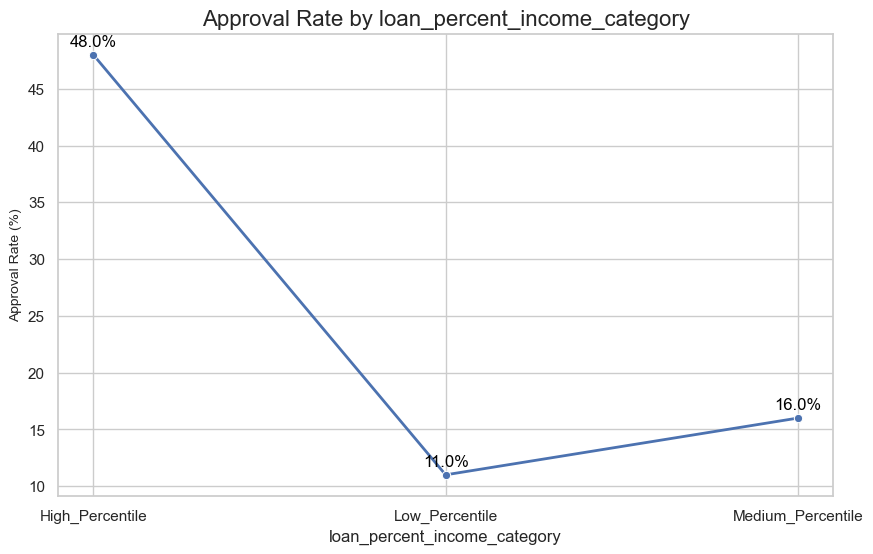

In [176]:
# Create the line chart
plt.figure(figsize=(10, 6))
sns.lineplot(data=approval_rates, x='loan_percent_income_category', y='Approval_Rate', marker='o', linewidth=2)

# Add data labels
for i, row in approval_rates.iterrows():
    plt.text(row['loan_percent_income_category'], row['Approval_Rate'] + 0.5, 
             f"{row['Approval_Rate']}%", 
             ha='center', va='bottom', fontsize=12, color='black')

# Title and labels
plt.title('Approval Rate by loan_percent_income_category', fontsize=16)
plt.xlabel('loan_percent_income_category', fontsize=12)
plt.ylabel('Approval Rate (%)', fontsize=10)

# Show the plot
plt.show()

## what is the count of laon_status by credit score category?

In [177]:
def categorize_credit_score(credit_score):
    if credit_score < 601:
        return 'Low Credit Score'
    elif 601 <= credit_score <= 669:
        return 'Fair Credit Score'
    elif 670 <= credit_score <= 739:
        return 'Good Credit Score'
    else:
        return 'Excellent Credit Score'

# Apply the function to the 'credit_score' column
df['credit_score_category'] = df['credit_score'].apply(categorize_credit_score)

In [178]:
grouped = df.groupby(['credit_score_category', 'loan_status']).size().reset_index(name='count')
grouped

,credit_score_category,loan_status,count
0,Excellent Credit Score,No,62
1,Excellent Credit Score,Yes,20
2,Fair Credit Score,No,17569
3,Fair Credit Score,Yes,5077
4,Good Credit Score,No,8754
5,Good Credit Score,Yes,2405
6,Low Credit Score,No,8561
7,Low Credit Score,Yes,2487


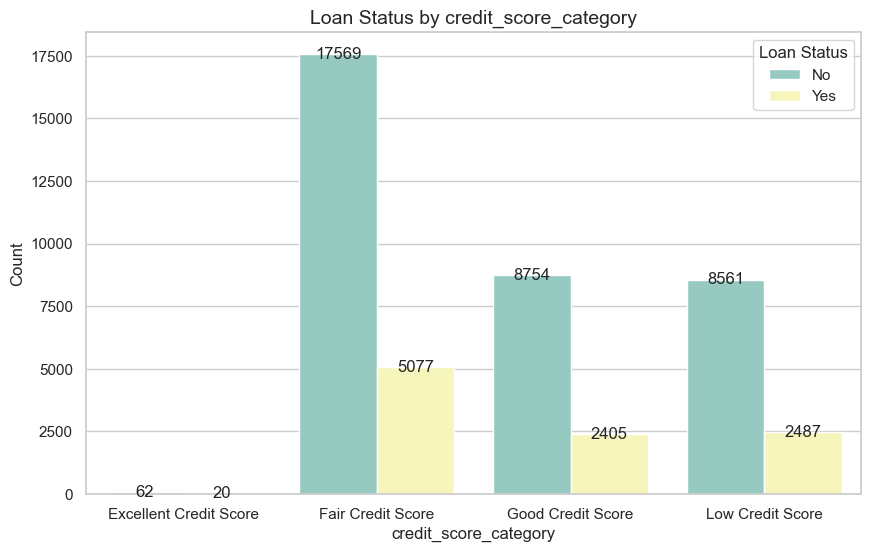

In [179]:
# Sample grouped data
grouped = df.groupby(['credit_score_category', 'loan_status']).size().reset_index(name='count')

# Create the bar plot
plt.figure(figsize=(10, 6))  # Adjust figure size
barplot = sns.barplot(data=grouped, x='credit_score_category', y='count', hue='loan_status', palette='Set3')

# Add labels on top of each bar
for bar in barplot.patches:
    bar_x = bar.get_x() + bar.get_width() / 2  # Center horizontally
    bar_height = bar.get_height()  # Height of the bar
    if bar_height > 0:  # Avoid labeling bars with no height
        plt.text(
            bar.get_x() + bar.get_width() / 2,  # X position
            bar_height + 0.5,  # Y position (slightly above the bar)
            f'{int(bar_height)}',  # Text label
            ha='center',
            va='center',
            fontsize=12
        )

# Add labels, title, and legend
plt.xlabel('credit_score_category', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Loan Status by credit_score_category', fontsize=14)
plt.legend(title='Loan Status', loc='upper right')

# Display the plot
plt.show()

## what are tha approval rates for each credit Score Category?

In [180]:
grouped = df.groupby(['credit_score_category'])['loan_status']
# Calculate approval rate (assuming 'Yes' and 'No' in Loan_Status)
approval_rates = grouped.apply(lambda x: (x == 'Yes').mean() * 100).reset_index(name='Approval_Rate').round()
approval_rates['Approval_Rate'] = approval_rates['Approval_Rate']

In [181]:
approval_rates

,credit_score_category,Approval_Rate
0,Excellent Credit Score,24.0
1,Fair Credit Score,22.0
2,Good Credit Score,22.0
3,Low Credit Score,23.0


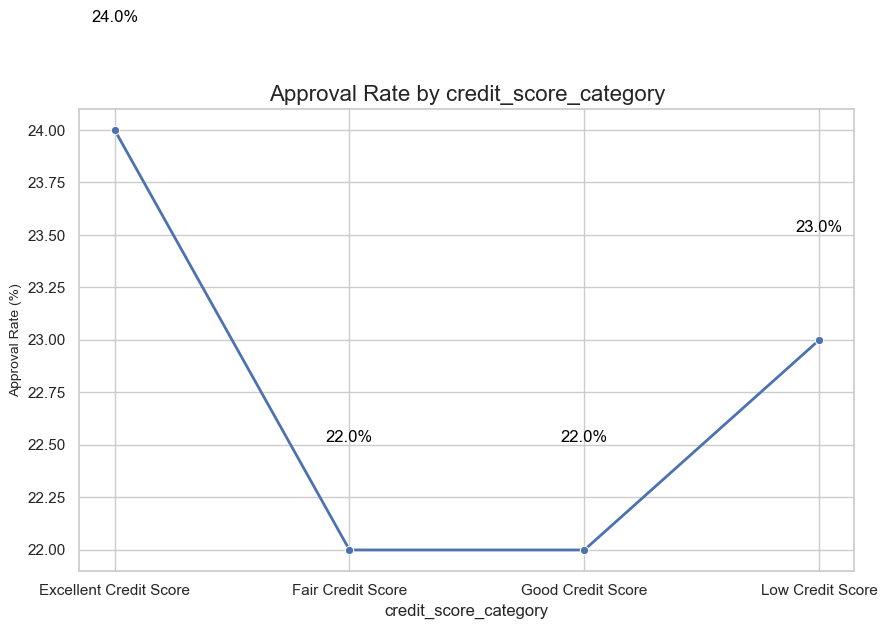

In [182]:
# Create the line chart
plt.figure(figsize=(10, 6))
sns.lineplot(data=approval_rates, x='credit_score_category', y='Approval_Rate', marker='o', linewidth=2)

# Add data labels
for i, row in approval_rates.iterrows():
    plt.text(row['credit_score_category'], row['Approval_Rate'] + 0.5, 
             f"{row['Approval_Rate']}%", 
             ha='center', va='bottom', fontsize=12, color='black')

# Title and labels
plt.title('Approval Rate by credit_score_category', fontsize=16)
plt.xlabel('credit_score_category', fontsize=12)
plt.ylabel('Approval Rate (%)', fontsize=10)

# Show the plot
plt.show()

## what is the count of loan_status by previous_loan_defaults?

In [183]:
grouped = df.groupby(['previous_loan_defaults_on_file', 'loan_status']).size().reset_index(name='count')
grouped

,previous_loan_defaults_on_file,loan_status,count
0,No,No,12106
1,No,Yes,9989
2,Yes,No,22840


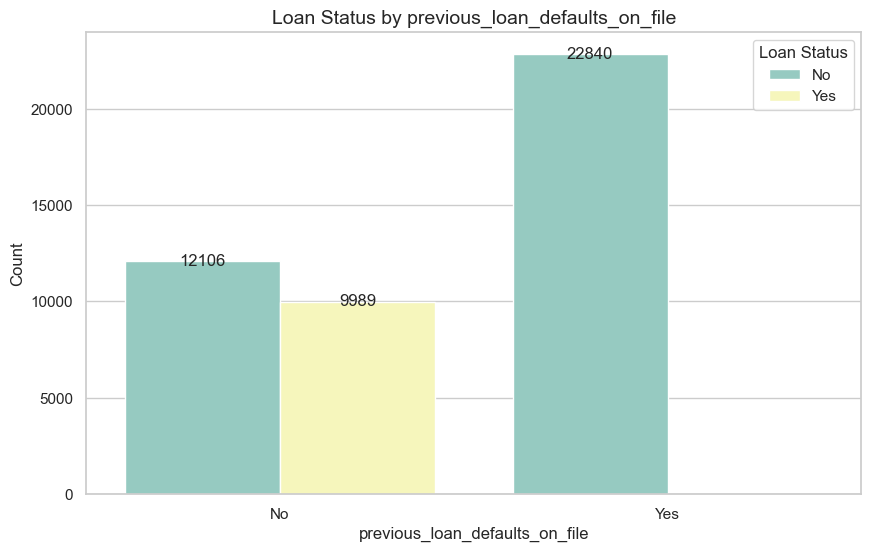

In [184]:
grouped = df.groupby(['previous_loan_defaults_on_file', 'loan_status']).size().reset_index(name='count')

# Create the bar plot
plt.figure(figsize=(10, 6))  # Adjust figure size
barplot = sns.barplot(data=grouped, x='previous_loan_defaults_on_file', y='count', hue='loan_status', palette='Set3')

# Add labels on top of each bar
for bar in barplot.patches:
    bar_x = bar.get_x() + bar.get_width() / 2  # Center horizontally
    bar_height = bar.get_height()  # Height of the bar
    if bar_height > 0:  # Avoid labeling bars with no height
        plt.text(
            bar.get_x() + bar.get_width() / 2,  # X position
            bar_height + 0.5,  # Y position (slightly above the bar)
            f'{int(bar_height)}',  # Text label
            ha='center',
            va='center',
            fontsize=12
        )

# Add labels, title, and legend
plt.xlabel('previous_loan_defaults_on_file', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Loan Status by previous_loan_defaults_on_file', fontsize=14)
plt.legend(title='Loan Status', loc='upper right')

# Display the plot
plt.show()

## what are the loan approval for Pervious_Loan_Defaults?

In [185]:
grouped = df.groupby(['previous_loan_defaults_on_file'])['loan_status']
# Calculate approval rate (assuming 'Yes' and 'No' in Loan_Status)
approval_rates = grouped.apply(lambda x: (x == 'Yes').mean() * 100).reset_index(name='Approval_Rate').round()
approval_rates['Approval_Rate'] = approval_rates['Approval_Rate']

In [186]:
approval_rates

,previous_loan_defaults_on_file,Approval_Rate
0,No,45.0
1,Yes,0.0


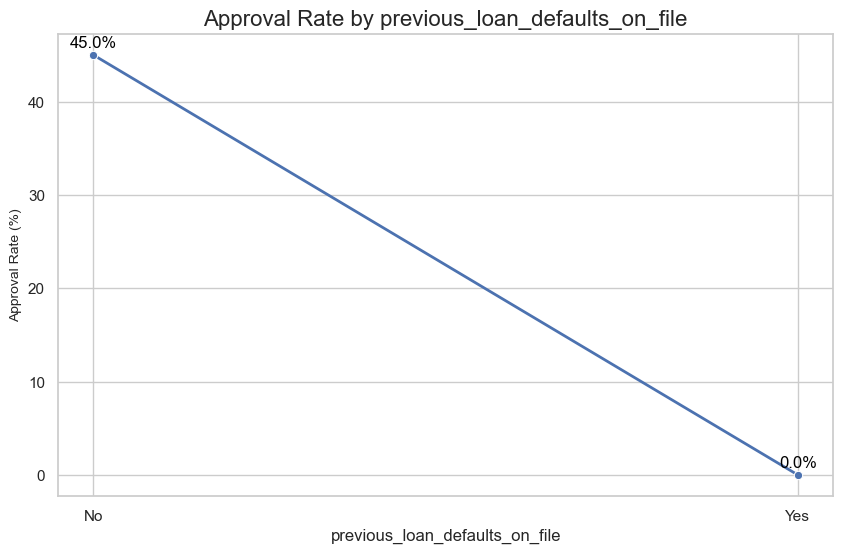

In [187]:
# Create the line chart
plt.figure(figsize=(10, 6))
sns.lineplot(data=approval_rates, x='previous_loan_defaults_on_file', y='Approval_Rate', marker='o', linewidth=2)

# Add data labels
for i, row in approval_rates.iterrows():
    plt.text(row['previous_loan_defaults_on_file'], row['Approval_Rate'] + 0.5, 
             f"{row['Approval_Rate']}%", 
             ha='center', va='bottom', fontsize=12, color='black')

# Title and labels
plt.title('Approval Rate by previous_loan_defaults_on_file', fontsize=16)
plt.xlabel('previous_loan_defaults_on_file', fontsize=12)
plt.ylabel('Approval Rate (%)', fontsize=10)

# Show the plot
plt.show()

In [188]:
df['loan_status_numeric'] = df['loan_status'].apply(lambda x: 1 if x == 'Yes' else 0)
df

,person_age,person_gender,person_education,person_income,person_emp_exp,person_home_ownership,loan_amnt,loan_intent,loan_int_rate,loan_percent_income,...,monthly_income,debt_repayment_capacity,person_income_stability,income_stability_category,person_income_credit_history,income_credit_history_category,monthly_income_category,loan_percent_income_category,credit_score_category,loan_status_numeric
0,22,female,Master,71948.0,0,RENT,35000.0,PERSONAL,16.02,0.49,...,5996.0,66341.0000,0.0,Low Stability,23982.666667,Medium_income_credit,Low_Monthly_income,High_Percentile,Low Credit Score,1
1,21,female,High School,12282.0,0,OWN,1000.0,EDUCATION,11.14,0.08,...,1024.0,12170.6000,0.0,Low Stability,6141.000000,Low_income_credit,Low_Monthly_income,Medium_Percentile,Low Credit Score,0
2,25,female,High School,12438.0,3,MORTGAGE,5500.0,MEDICAL,12.87,0.44,...,1036.0,11730.1500,37314.0,Low Stability,4146.000000,Low_income_credit,Low_Monthly_income,High_Percentile,Fair Credit Score,1
3,23,female,Bachelor,79753.0,0,RENT,35000.0,MEDICAL,15.23,0.44,...,6646.0,74422.5000,0.0,Low Stability,39876.500000,High_income_credit,Low_Monthly_income,High_Percentile,Good Credit Score,1
4,24,male,Master,66135.0,1,RENT,35000.0,MEDICAL,14.27,0.53,...,5511.0,61140.5000,66135.0,Medium-Low Stability,16533.750000,Medium_income_credit,Low_Monthly_income,High_Percentile,Low Credit Score,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44980,27,male,Associate,47971.0,6,RENT,15000.0,MEDICAL,15.66,0.31,...,3998.0,45622.0000,287826.0,Medium-High Stability,15990.333333,Medium_income_credit,Low_Monthly_income,High_Percentile,Fair Credit Score,1
44981,37,female,Associate,65800.0,17,RENT,9000.0,HOMEIMPROVEMENT,14.07,0.14,...,5483.0,64533.7000,1118600.0,High Stability,5981.818182,Low_income_credit,Low_Monthly_income,Medium_Percentile,Fair Credit Score,1
44982,33,male,Associate,56942.0,7,RENT,2771.0,DEBTCONSOLIDATION,10.02,0.05,...,4745.0,56664.3458,398594.0,Medium-High Stability,5694.200000,Low_income_credit,Low_Monthly_income,Low_Percentile,Fair Credit Score,1
44983,29,male,Bachelor,33164.0,4,RENT,12000.0,EDUCATION,13.23,0.36,...,2764.0,31576.4000,132656.0,Medium-Low Stability,5527.333333,Low_income_credit,Low_Monthly_income,High_Percentile,Fair Credit Score,1


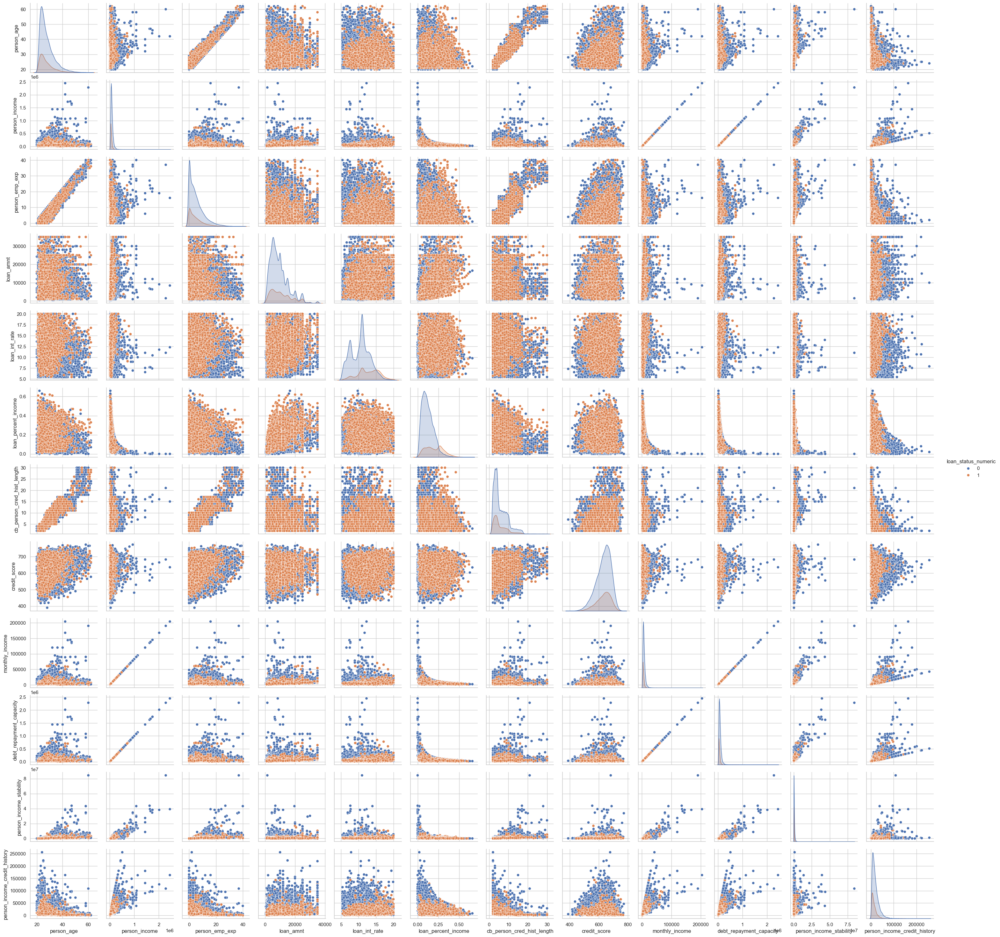

In [189]:
sns.pairplot(df , hue = 'loan_status_numeric')

In [190]:
grouped = df.groupby(['income_group', ]).agg(
    approval_rate=('loan_status_numeric', 'mean')
).reset_index()
grouped

,income_group,approval_rate
0,High,0.101235
1,Low,0.379699
2,Medium,0.160340
3,Very High,0.000000


In [191]:
pivot_table = grouped.pivot_table(
    index='income_group', columns='grouped_age', values='approval_rate', aggfunc='mean'
)

# Set up the plot
plt.figure(figsize=(10, 6))
sns.heatmap(pivot_table, annot=True, cmap="YlGnBu", cbar_kws={'label': 'Approval Rate'})

# Title and labels
plt.title("Loan Approval Rates by Income Group and Age Group")
plt.xlabel('Age Group')
plt.ylabel('Income Group')

# Show the plot
plt.show()

KeyError: 'grouped_age'

In [ ]:
df.columns

In [ ]:
yes_defaults_customers = df[df['previous_loan_defaults_on_file'] == "Yes"]
yes_defaults_customers

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming yes_defaults_customers is already defined
# Filter the dataset for customers who have defaulted (i.e., "Yes")
yes_defaults_customers = df[df['previous_loan_defaults_on_file'] == 'Yes']

# Loop over all object-type columns and plot their distributions for "yes_defaults_customers"
for col in df.select_dtypes('object').columns:
    plt.figure(figsize=(6, 4))  # Reduce the figure size for better compactness
    sns.countplot(data=yes_defaults_customers, x=col, palette='Set2')
    plt.title(f'Distribution of {col} for Customers with Previous Loan Defaults')
    plt.xticks(rotation=45)  # Rotate x labels for better visibility if needed
    plt.tight_layout()  # Ensure everything fits within the plot area
    plt.show()  # Show each plot individually, so they don't stack

In [ ]:
# Assuming yes_defaults_customers is already defined
# Filter the dataset for customers who have defaulted (i.e., "Yes")
yes_defaults_customers = df[df['previous_loan_defaults_on_file'] == 'Yes']

# Get the object-type columns
object_columns = df.select_dtypes('object').columns

# Determine the number of rows and columns for the subplot grid
n_cols = 3  # Define the number of columns you want in the grid
n_rows = (len(object_columns) + n_cols - 1) // n_cols  # Calculate the required number of rows

# Create a figure with subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, n_rows * 4))

# Flatten the axes array for easier indexing (if you have a 2D grid of axes)
axes = axes.flatten()

# Loop over all object-type columns and plot their distributions for "yes_defaults_customers"
for i, col in enumerate(object_columns):
    sns.countplot(data=yes_defaults_customers, x=col, palette='Set2', ax=axes[i])
    axes[i].set_title(f'Distribution of {col} for Customers with Previous Loan Defaults')
    axes[i].tick_params(axis='x', rotation=45)  # Rotate x labels for better visibility

# Hide any extra axes (if the grid has empty spaces)
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Adjust layout to ensure everything fits within the plot area
plt.tight_layout()
plt.show()

In [ ]:
no_defaults_customers = df[df['previous_loan_defaults_on_file'] == "No"]
no_defaults_customers

In [ ]:
# Filter the dataset for customers with no previous loan defaults and loan status is "No"
no_defaults_customers = df[(df['previous_loan_defaults_on_file'] == 'No') & (df['loan_status'] == 'No')]

# Get the categorical columns
categorical_columns = df.select_dtypes('object').columns

# Calculate the number of rows and columns for the subplot grid
n_cols = 3  # Number of columns in the grid (you can adjust this)
n_rows = (len(categorical_columns) + n_cols - 1) // n_cols  # Number of rows based on total columns

# Create the figure with subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, n_rows * 4))

# Flatten the axes array for easier indexing
axes = axes.flatten()

# Plot Categorical Features
for i, col in enumerate(categorical_columns):
    sns.countplot(data=no_defaults_customers, x=col, palette='Set2', ax=axes[i])
    axes[i].set_title(f'{col} - Count Plot')
    axes[i].tick_params(axis='x', rotation=45)  # Rotate x labels for better visibility

# Hide any extra axes (if the grid has empty spaces)
for k in range(len(categorical_columns), len(axes)):
    axes[k].axis('off')

# Adjust layout to ensure everything fits nicely
plt.tight_layout()
plt.show()

In [ ]:
# Filter the dataset for customers with no previous loan defaults and loan status is "No"
no_defaults_customers = df[(df['previous_loan_defaults_on_file'] == 'No') & (df['loan_status'] == 'Yes')]

# Get the categorical columns
categorical_columns = df.select_dtypes('object').columns

# Calculate the number of rows and columns for the subplot grid
n_cols = 3  # Number of columns in the grid (you can adjust this)
n_rows = (len(categorical_columns) + n_cols - 1) // n_cols  # Number of rows based on total columns

# Create the figure with subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, n_rows * 4))

# Flatten the axes array for easier indexing
axes = axes.flatten()

# Plot Categorical Features
for i, col in enumerate(categorical_columns):
    sns.countplot(data=no_defaults_customers, x=col, palette='Set2', ax=axes[i])
    axes[i].set_title(f'{col} - Count Plot')
    axes[i].tick_params(axis='x', rotation=45)  # Rotate x labels for better visibility

# Hide any extra axes (if the grid has empty spaces)
for k in range(len(categorical_columns), len(axes)):
    axes[k].axis('off')

# Adjust layout to ensure everything fits nicely
plt.tight_layout()
plt.show()

In [ ]:
# Filter the dataset for customers with no previous loan defaults and loan status is "Yes"
no_defaults_customers = df[(df['previous_loan_defaults_on_file'] == 'No') & (df['loan_status'] == 'Yes')]

# Get the categorical columns
categorical_columns = df.select_dtypes('object').columns

# Calculate the number of rows and columns for the subplot grid
n_cols = 3  # Number of columns in the grid (you can adjust this)
n_rows = (len(categorical_columns) + n_cols - 1) // n_cols  # Number of rows based on total columns

# Create the figure with subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, n_rows * 4))  # Adjusting figsize for presentation

# Flatten the axes array for easier indexing
axes = axes.flatten()

# Plot Categorical Features
for i, col in enumerate(categorical_columns):
    sns.countplot(data=no_defaults_customers, x=col, palette='Set2', ax=axes[i])
    axes[i].set_title(f'{col} - Count Plot', fontsize=12)
    axes[i].tick_params(axis='x', rotation=45, labelsize=10)  # Rotate x labels for better visibility

# Hide any extra axes (if the grid has empty spaces)
for k in range(len(categorical_columns), len(axes)):
    axes[k].axis('off')

# Adjust layout to ensure everything fits nicely
plt.tight_layout()

# Save the figure to a file (optional, for easy inclusion in presentations)
plt.savefig('loan_defaults_no_defaults_customers_board.png', bbox_inches='tight', dpi=300)

# Show the plots
plt.show()